# Preambule

In [1]:
%%capture
#!/usr/bin/env python
from past.utils import old_div
try:
    get_ipython().magic(u'load_ext autoreload')
    get_ipython().magic(u'autoreload 2')
    get_ipython().magic(u'matplotlib qt')
except:
    pass

import logging
import matplotlib.pyplot as plt
import numpy as np

logging.basicConfig(format=
                          "%(relativeCreated)12d [%(filename)s:%(funcName)20s():%(lineno)s] [%(process)d] %(message)s",
                    # filename="/tmp/caiman.log",
                    level=logging.DEBUG)

import caiman as cm
from caiman.source_extraction import cnmf
from caiman.utils.utils import download_demo
from caiman.utils.visualization import inspect_correlation_pnr, nb_inspect_correlation_pnr
from caiman.motion_correction import MotionCorrect
from caiman.source_extraction.cnmf import params as params
from caiman.utils.visualization import plot_contours, nb_view_patches, nb_plot_contour
import cv2

try:
    cv2.setNumThreads(0)
except:
    pass
import bokeh.plotting as bpl
import holoviews as hv

In [2]:
%matplotlib inline

Loading BokehJS ...

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
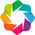

In [3]:
bpl.output_notebook()
hv.notebook_extension('bokeh')

In [4]:
import os

In [5]:
%config InlineBackend.figure_format = 'retina'

In [6]:
from sys import path as syspath
syspath.append("/Users/srdjan/Documents/Physio_Ca/functions/")
from physio_def_1 import *

syspath.append("/Users/srdjan/Seafile/functions/")

from general_functions import autocorr

# Importing from npz

In [ ]:
# npzFile = "/Volumes/physio/team/slakrupnik/project/experiments/Old/ExperimentOGB/ExperimentOGB_28_Series032.npz"
# npzFile = "/Volumes/physio/team/slakrupnik/project/experiments/Sandra/2019_10_16/Experiment39e/Experiment39e_2_Series012.npz"
# npzFile = "/Volumes/physio/team/slakrupnik/project/experiments/Sandra/NIKON/2019_09_25/Slice2_Glu8_007/Slice2_Glu8_007.npz"
# npzFile = "/Volumes/physio/team/slakrupnik/project/experiments/Ya-Chi/Nov 6 2019/Nov 6 2019_16_Series106_6mM glucose.npz"
npzFile = "Experiment39e_2_Series012.npz"

npzData = np.load(npzFile)

orig_images = npzData["data"]

In [8]:
origFrameRate = 85.4

In [9]:
# time = npzData["time"]
time = np.arange(len(orig_images))/origFrameRate

In [10]:
# from pandas import read_csv
# metadata = read_csv(npzFile.replace("npz","txt")).loc[0]
# print(metadata)

In [11]:
m_orig = cm.movie(orig_images)

In [12]:
m_orig.fr = origFrameRate#metadata.freq

In [13]:
time.max()/60

16.423692427790787

In [14]:
1./np.diff(time).mean()

85.4

In [15]:
orig_images.shape

(84156, 128, 128)

In [16]:
allTrace = orig_images.mean((1,2))

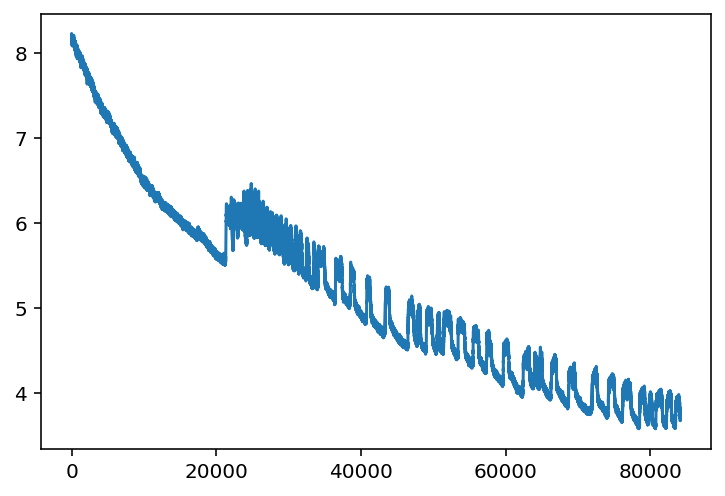

In [17]:
plt.plot(allTrace)

In [18]:
# m_orig[::100,:,:].play(fr=1000, magnification = 5,do_loop=False)

In [21]:
base_name = os.path.split(npzFile)[1].rstrip(".npz")+f"_f={origFrameRate:.1f}Hz"

In [22]:
base_name

'Experiment39e_2_Series012_f=85.4Hz'

In [23]:
#%% start a cluster for parallel processing (if a cluster already exists it will be closed and a new session will be opened)
if 'dview' in locals():
    cm.stop_server(dview=dview)
c, dview, n_processes = cm.cluster.setup_cluster(
    backend='local', n_processes=None, single_thread=False)

In [28]:
from matplotlib.colors import LogNorm

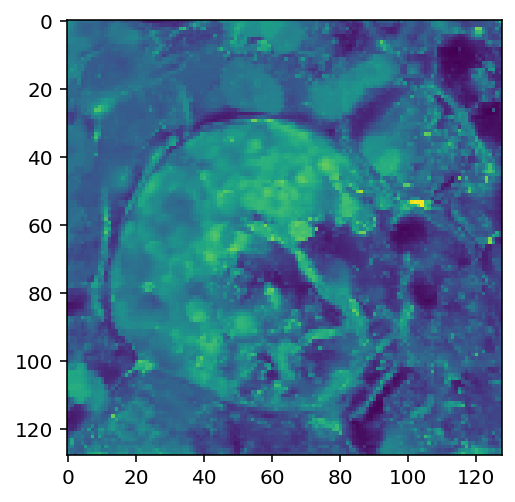

In [29]:
plt.imshow(orig_images[-10000:].std(0),norm=LogNorm())

In [49]:
idx = (slice(len(orig_images)-10000,len(orig_images)), slice(30,70), slice(30,80))

In [57]:
tWin = 20
imgSave = rebin(orig_images[idx],tWin)

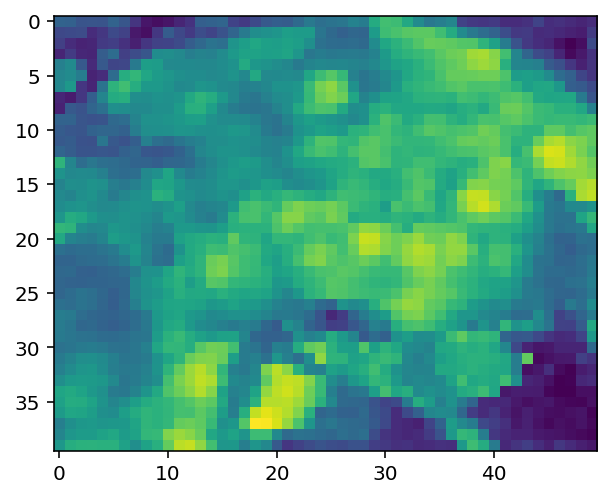

In [58]:
plt.imshow(imgSave.std(0),norm=LogNorm())

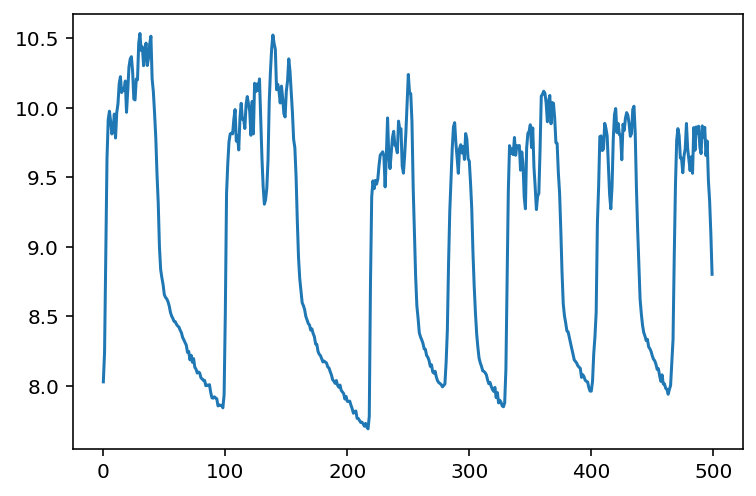

In [59]:
plt.plot(imgSave.mean((1,2)))

In [61]:
fnames = cm.save_memmap([imgSave], base_name="tmp",
                               order='C', border_to_0=0, dview=dview)
# del orig_images

In [72]:
# meanx = orig_images.mean(axis=(1,2))

In [62]:
del orig_images

In [73]:
# tWin = 1
# plt.plot(rebin(time,tWin),rebin(meanx,tWin))

## resize

In [128]:
newFreq = 3
tWin = int(np.ceil(metadata.freq/newFreq))
newFreq = metadata.freq/tWin
newFreq

2.4828730437513302

In [129]:
newFreq/metadata.freq

0.25

In [130]:
m_resized = m_orig[:,100:200,:100].resize(1,1,newFreq/metadata.freq)

In [135]:
base_name = os.path.split(npzFile)[1].rstrip(".npz")+f"_100-200_0-100_f={m_resized.fr:.1f}Hz"

In [136]:
base_name

'ExperimentOGB_28_Series032_100-200_0-100_f=2.5Hz'

In [137]:
#%% start a cluster for parallel processing (if a cluster already exists it will be closed and a new session will be opened)
if 'dview' in locals():
    cm.stop_server(dview=dview)
c, dview, n_processes = cm.cluster.setup_cluster(
    backend='local', n_processes=None, single_thread=False)

In [138]:
fnames = cm.save_memmap([np.asarray(m_resized)], base_name=base_name,
                               order='C', border_to_0=0, dview=dview)
# del orig_images

In [131]:
# m_resized[::-1].play(fr=500, magnification=5, do_loop=False, q_max=100)

In [37]:
# from collections import Counter

In [38]:
# plt.step?

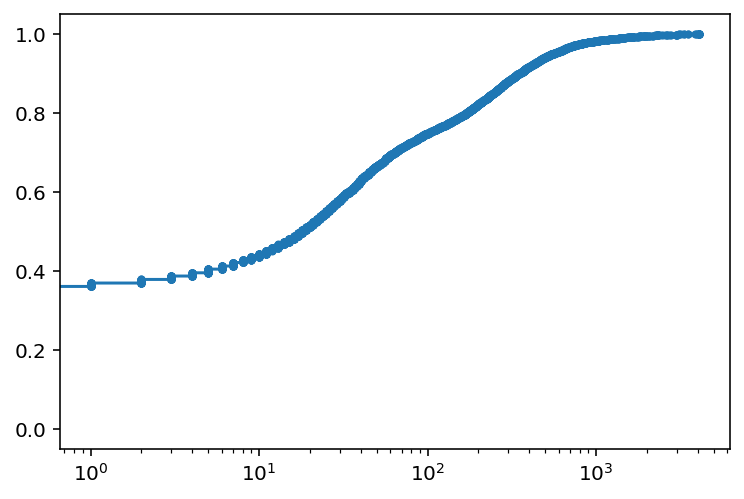

In [39]:
Nrand = 10000
rndidx = tuple([np.random.randint(d,size=Nrand) for d in orig_images.shape])
x = sorted(orig_images[rndidx])
plt.step(x,np.linspace(0,1,len(x)+1)[1:],".-",where="post")
# x,y = np.array(Counter(orig_images[rndidx]).most_common()).T
# plt.bar(x,y)
# plt.errorbar(x,y,y**.5, ls="none",color="C1", marker=".")
# plt.yscale("log")
plt.xscale("log")

In [53]:
n = 100
meanImage = orig_images[::n].mean(0)
stdImage  = orig_images[::n].std (0)

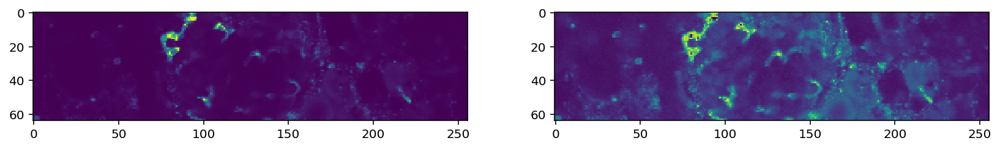

In [54]:
fig, axs = plt.subplots(1,2,figsize=(14,6))
axs[0].imshow(meanImage)
axs[1].imshow( stdImage)

## Check a representative low-intensity pixel

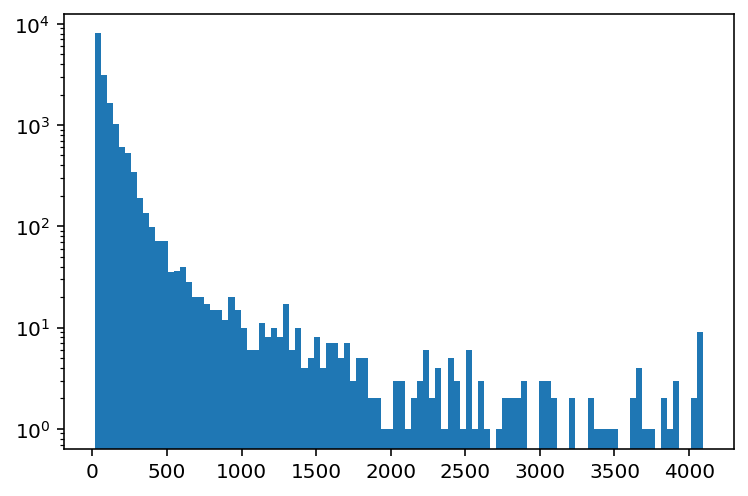

In [31]:
plt.hist(meanImage.flatten(),100);
plt.yscale("log")

In [45]:
tmp = np.abs(meanImage - np.percentile(meanImage.flatten(),.1))
lowPx = np.where(tmp == tmp.min())

In [46]:
lowPx

(array([54]), array([1]))

In [47]:
lowTrace = orig_images[(slice(None),)+lowPx].flatten()

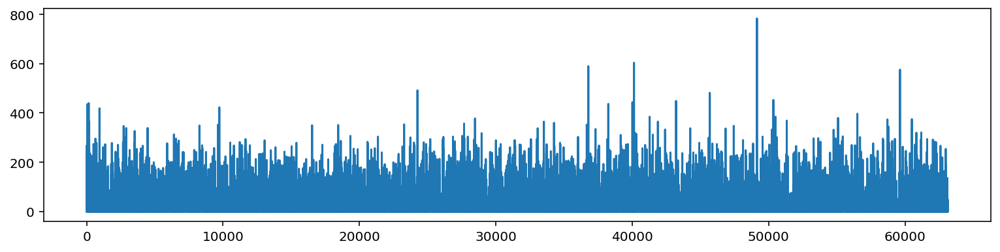

In [48]:
plt.figure(figsize=(13,3))
plt.plot(lowTrace)

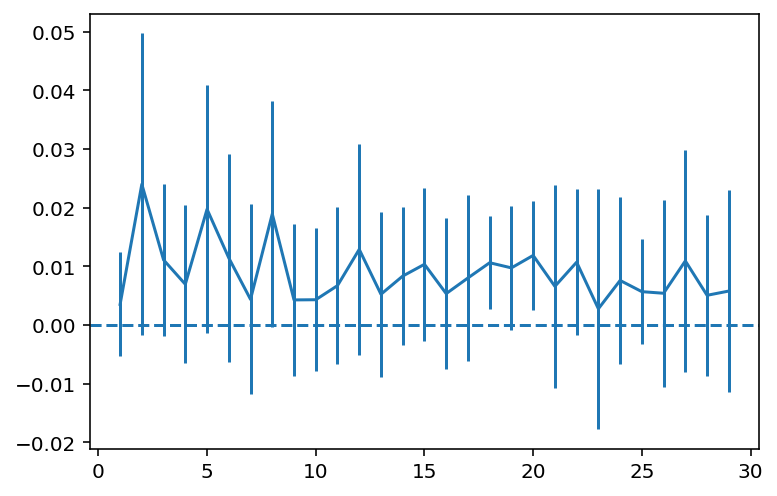

In [49]:
tr = np.arange(1,30)
xa = autocorr(lowTrace,tr,10)
plt.errorbar(tr,*xa)
plt.axhline(0,ls="--")

In [50]:
from scipy.stats import distributions as dst

/Users/srdjan/anaconda2/envs/caiman/lib/python3.7/site-packages/ipykernel_launcher.py:1: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  """Entry point for launching an IPython kernel.


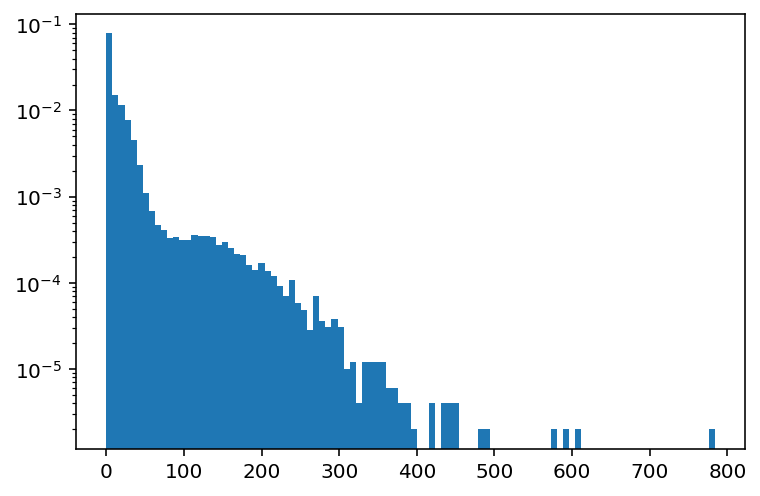

In [52]:
plt.hist(lowTrace,100,log=True, normed=True);

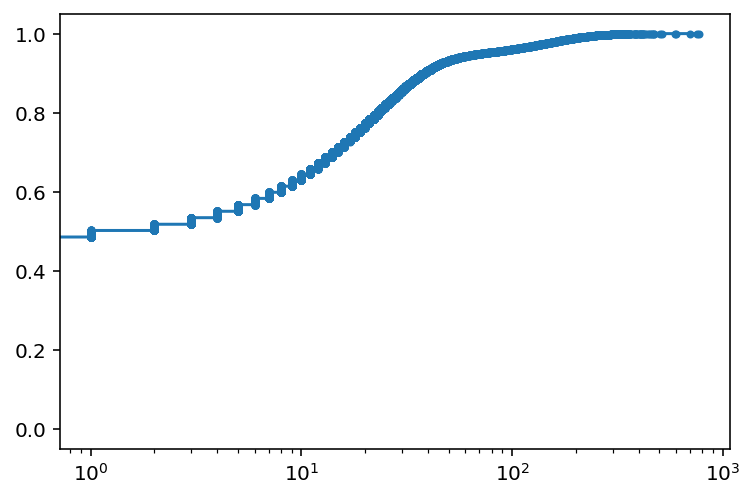

In [37]:
x = sorted(lowTrace)
plt.step(x,np.linspace(0,1,len(x)+1)[1:],".-",where="post")
plt.xscale("log")

In [36]:
# cc = Counter(lowTrace)
# cc = [(k,cc[k]) for k in sorted(cc.keys())]
# x,y = np.array(cc).T
# ye = y**.5
# plt.bar(x,y/y.sum())
# plt.errorbar(x,y/y.sum(),ye/y.sum(),ls="none",color="C1",marker=".")
# plt.yscale("log")
# lowMean = lowTrace.mean()
# plt.plot(x,dst.poisson.pmf(x,lowMean,),"C2",lw=.5)

In [42]:
# dst.poisson.pmf(x,lowMean,)*y.sum()

In [43]:
chi2 = (((dst.poisson.pmf(x,lowMean,)*y.sum()-y)/ye)**2).sum()

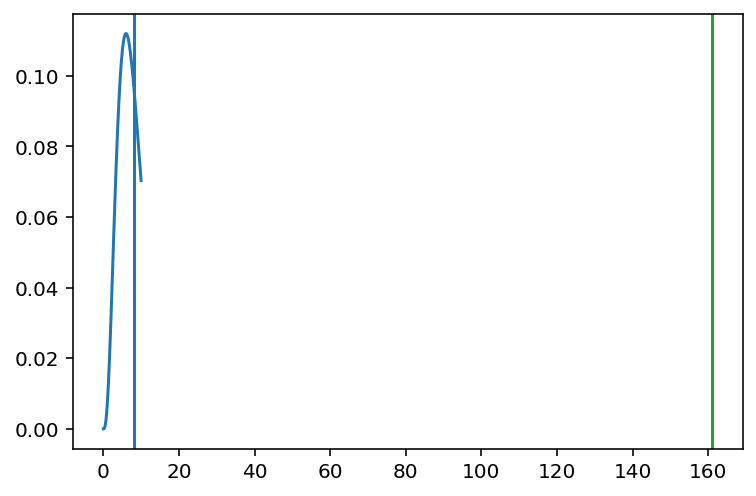

In [44]:
xr = np.arange(0,10,.03)
df  = len(y)-1
plt.plot(xr,dst.chi2.pdf(xr,df=df))
plt.axvline(dst.chi2(df).mean())
plt.axvline(chi2,color="C2")

In [45]:
logPv = dst.chi2.logsf(chi2,df=len(y)-1)

In [46]:
logPv

-69.09411224373143

In [47]:
metadata.freq

84.19246562150806

In [45]:
# fnames = cm.save_memmap([orig_images], base_name=os.path.split(npzFile)[1].rstrip(".npz"),
#                                order='C', border_to_0=0, dview=dview)
# del orig_images

In [179]:
# del orig_images

## See patch of the movie

In [22]:
from matplotlib.colors import LogNorm

In [26]:
np.sum(orig_images==orig_images.max())

8

In [27]:
m_resized.play(fr=80*10, magnification =  4,do_loop=False)

In [75]:
rebT = rebin(time,tWin)

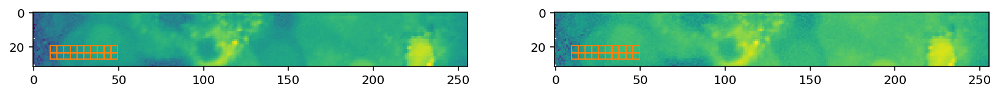

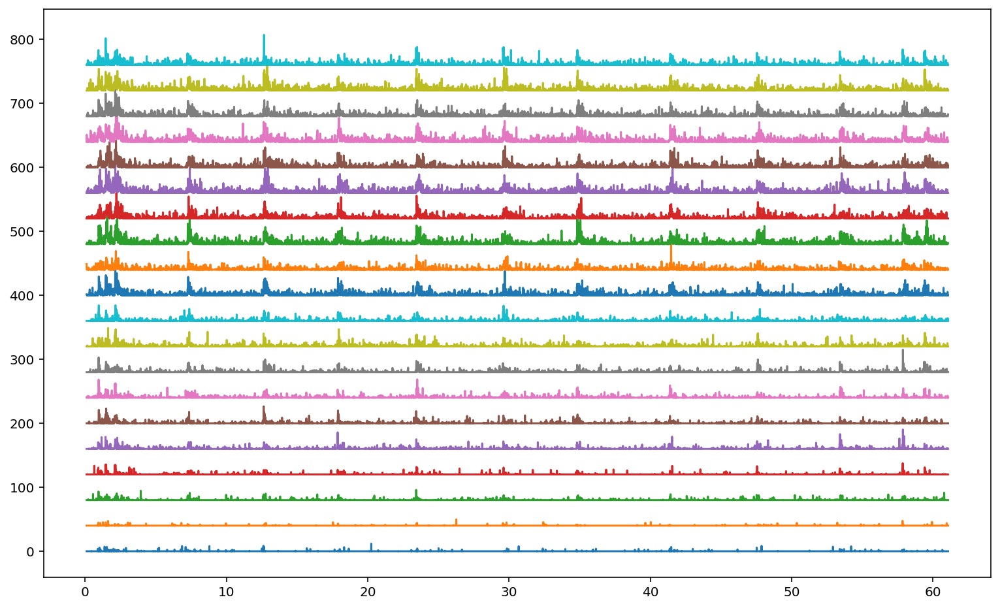

In [83]:
fig, axs = plt.subplots(1,2,figsize=(14,6))
axs[0].imshow(meanImage, norm=LogNorm())
axs[1].imshow( stdImage, norm=LogNorm())
x0,y0 = (210,20)
x0,y0 = (10,20)
pxWin = 4
pxShow = [(x0+i*pxWin,y0+j*pxWin) for i in range(10) for j in range(2)]

addRoisToImage(pxShow,pxWin=pxWin,ax=axs[1],label=False)
addRoisToImage(pxShow,pxWin=pxWin,ax=axs[0],label=False)
plt.show()
xs = getRoiProfiles([el[::-1] for el in pxShow],pxWin,image_=orig_images, tWin_=tWin)

plt.figure(figsize=(13,8))
for k in xs:
    plt.plot(rebT,xs[k]+40*k)

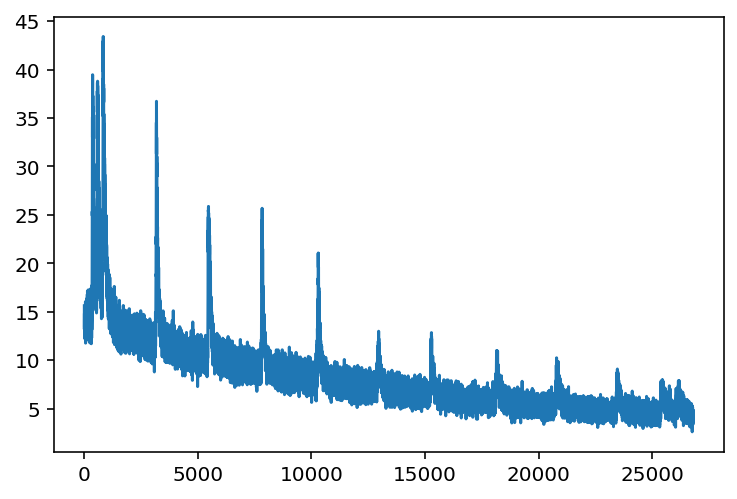

In [84]:
plt.plot(orig_images.mean((1,2)))

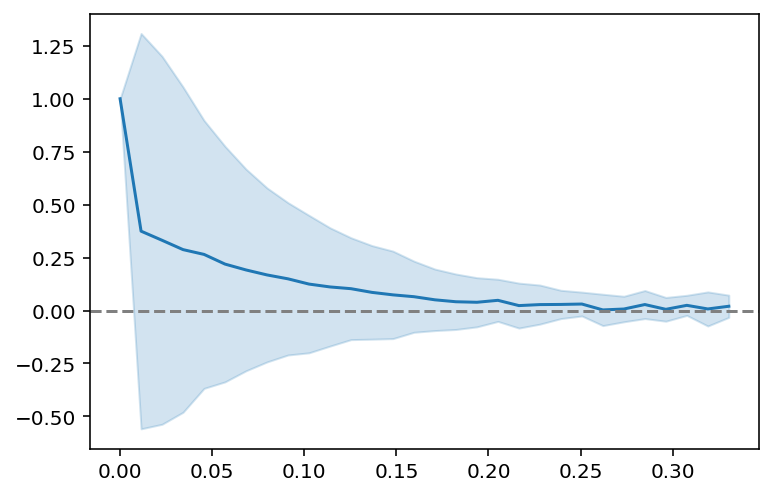

In [60]:
tr = np.arange(30)
y, ye = autocorr(x,tr,nsplits=10)
c = plt.plot(tr/newFreq, y)[0].get_color()
plt.fill_between(tr/newFreq, y-2*ye, y+2*ye,color=c,alpha = .2)
plt.axhline(0,color="grey",ls="--")

# Try de-trending

In [46]:
orig_images.shape

(63156, 64, 256)

In [47]:
metadata.freq

183.20319277068532

In [48]:
detrendingTscale = 10 # in sec

In [75]:
filterSize = int(detrendingTscale*metadata.freq)

if filterSize%2==0:
    filterSize+=1

In [90]:
tmp = np.abs(meanImage - np.percentile(meanImage.flatten(),99))
varPx = tuple(np.squeeze(np.where(tmp == tmp.min())))

In [91]:
varPx

(41, 153)

In [92]:
x = orig_images[(slice(None),)+varPx]

In [77]:
def percFilter0(x_,perc,filterSize):
    if filterSize%2==0:
        raise ValueError("filter size needs to be odd number")
    delta = filterSize//2
    out = np.zeros_like(x_)
    x_ = np.hstack([[x_[0]]*delta,x_,[x_[-1]]*delta])
    for i in range(len(out)):
        out[i] = np.percentile(x_[i:i+filterSize],perc)
    return out

In [94]:
xf = percFilter(x,2,filterSize)

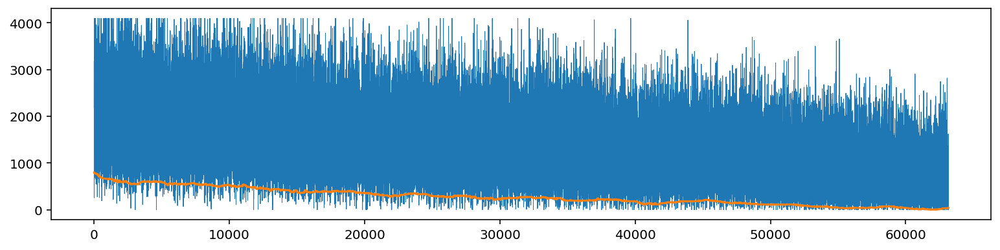

In [95]:
plt.figure(figsize=(13,3))
plt.plot(x, lw=.5)
plt.plot(xf)

In [101]:
from numba import jit

In [102]:
@jit 
def percFilter(x_,perc,filterSize):
    if filterSize%2==0:
        raise ValueError("filter size needs to be odd number")
    delta = filterSize//2
    out = np.zeros_like(x_)
    x_ = np.hstack([[x_[0]]*delta,x_,[x_[-1]]*delta])
    for i in range(len(out)):
        out[i] = np.percentile(x_[i:i+filterSize],perc)
    return out

In [103]:
@jit
def runningAverage(x_,filterSize):
    if filterSize%2==0:
        raise ValueError("filter size needs to be odd number")
    delta = filterSize//2
    out = np.zeros_like(x_)
    x_ = np.hstack([[x_[0]]*delta,x_,[x_[-1]]*delta])
#     print (x_.shape, out.shape)
    for i in range(len(out)):
        out[i] = np.nanmean(x_[i:i+filterSize])
    return out

In [97]:
percFilter(x,10,filterSize);

In [100]:
xff = runningAverage(xf,filterSize)

<ipython-input-98-696598dbc827>:1: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "runningAverage" failed type inference due to: Type of variable '$20.23' cannot be determined, operation: build_list(items=[Var($20.15, <ipython-input-98-696598dbc827> (7)), Var(x_, <ipython-input-98-696598dbc827> (3)), Var($20.22, <ipython-input-98-696598dbc827> (7))]), location: <ipython-input-98-696598dbc827> (7)

File "<ipython-input-98-696598dbc827>", line 7:
def runningAverage(x_,filterSize):
    <source elided>
    out = np.zeros_like(x_)
    x_ = np.hstack([[x_[0]]*delta,x_,[x_[-1]]*delta])
    ^

  @jit
<ipython-input-98-696598dbc827>:1: NumbaWarning: 
Compilation is falling back to object mode WITHOUT looplifting enabled because Function "runningAverage" failed type inference due to: Unsupported constraint encountered: raise $12.3

File "<ipython-input-98-696598dbc827>", line 4:
def runningAverage(x_,filterSize):
    <source elided>
    if fil

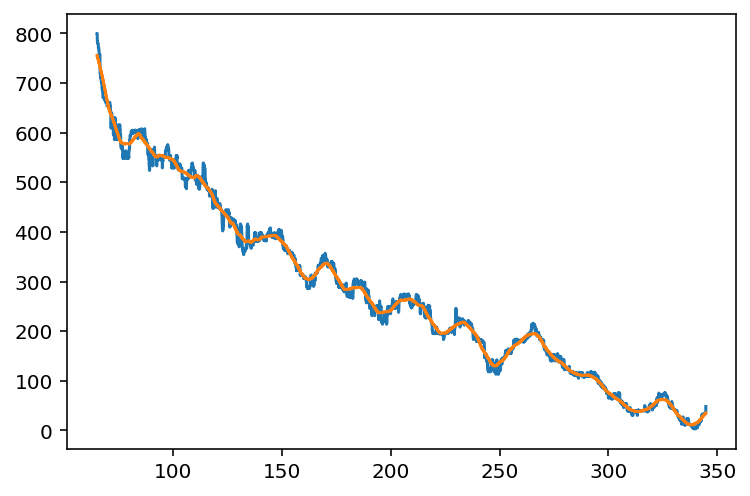

In [102]:
plt.plot(time, xf)
plt.plot(time, xff)

In [104]:
meanImage.size*1.2/3600

5.461333333333333

# Rest

In [58]:
from collections import OrderedDict

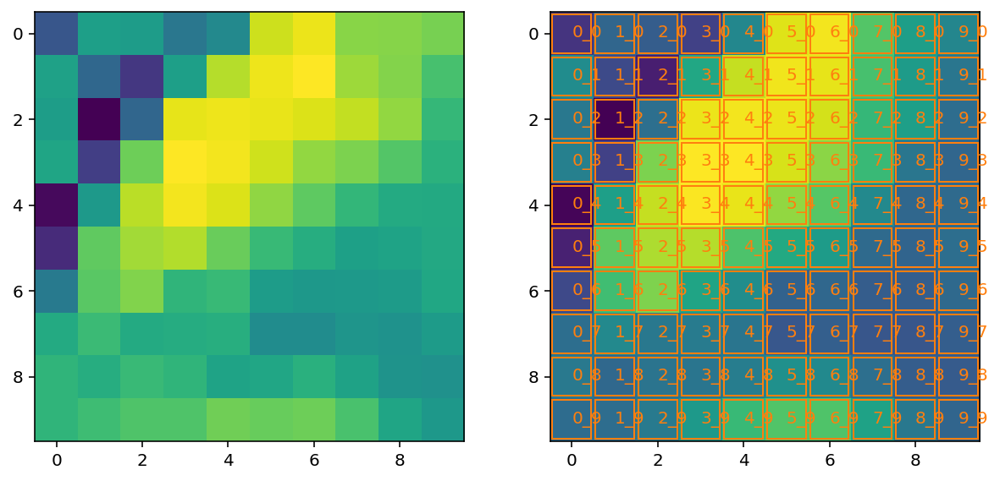

In [86]:
ix = (slice(None),slice(y0,y0+10),slice(x0,x0+10))
# ix = (slice(None),slice(78,82),slice(50,60))

fig, axs = plt.subplots(1,2,figsize=(10,6))
# axs[0].imshow(meanImage[ix[1:]], norm=LogNorm())
# axs[1].imshow( stdImage[ix[1:]], norm=LogNorm())
patch = np.array(m_orig[ix])
axs[0].imshow(patch.mean(0).T, norm=LogNorm())
axs[1].imshow(patch.std (0).T, norm=LogNorm())
pxShow = OrderedDict([ (f"{i}_{j}",(i,j)) for i in range(patch.shape[1]) for j in range(patch.shape[2])])
addRoisToImage(pxShow,ax=axs[1])
plt.show()
m_orig[ix].transpose((0,2,1)).play(magnification=7,fr=1000)

In [60]:
roiTraces = getRoiProfiles(pxShow,image_=patch, tWin_=1)

In [61]:
CC = np.corrcoef(list(roiTraces.values()))

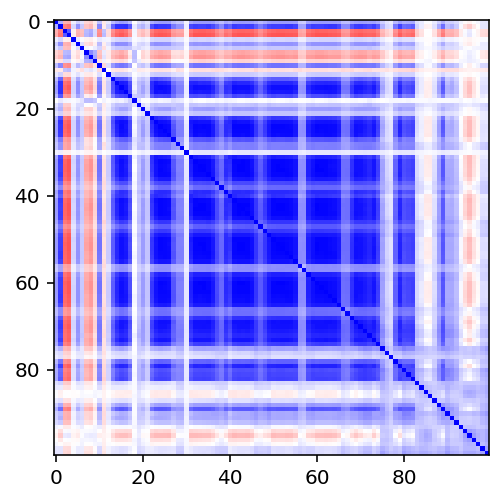

In [62]:
plt.imshow(CC, cmap="bwr_r", vmin=-1, vmax=1)

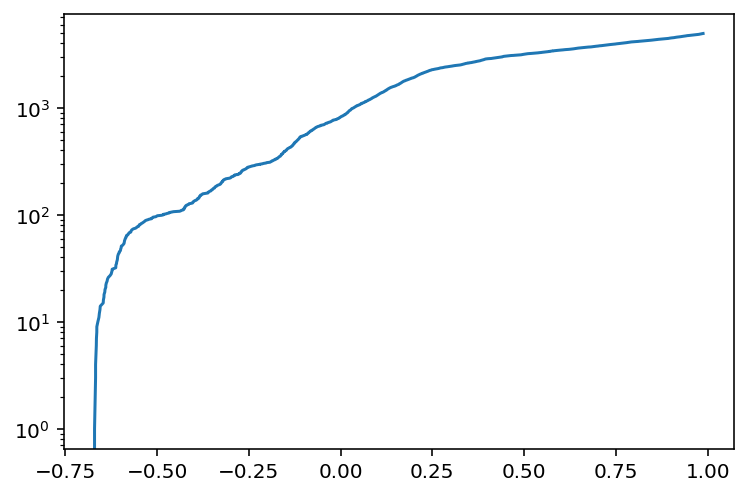

In [63]:
cc = CC[np.triu_indices_from(CC,1)]
plt.plot(sorted(cc), np.arange((CC.shape[0]-1)*(CC.shape[0])/2))
plt.yscale("log")

In [64]:
roiNames = list(roiTraces.keys())

In [65]:
cth = np.percentile(cc,3./len(cc)*100)

In [66]:
interesting = [(i,j) for i,j in zip(*np.where(CC<cth)) if i<j]

In [67]:
len(interesting)

3

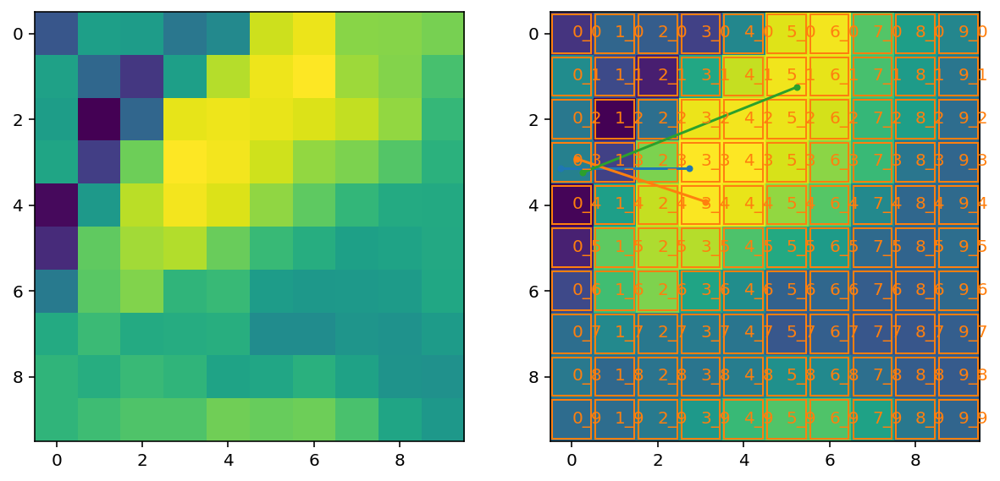

In [68]:
fig, axs = plt.subplots(1,2,figsize=(10,6))
axs[0].imshow(patch.mean(0).T, norm=LogNorm())
axs[1].imshow(patch.std (0).T, norm=LogNorm())
addRoisToImage(pxShow,ax=axs[1])
for i,j in interesting:
    n1,n2 = roiNames[i],roiNames[j]
    x,y = np.array([pxShow[n1],pxShow[n2]]).T
    r = (np.random.rand(2)-.5)*.7
#     plt.plot( x+r[0],y+r[1],"C3.-",lw=np.abs(CC[i,j])*2)
    plt.plot( x+r[0],y+r[1],".-")
plt.show()

(10, 11)

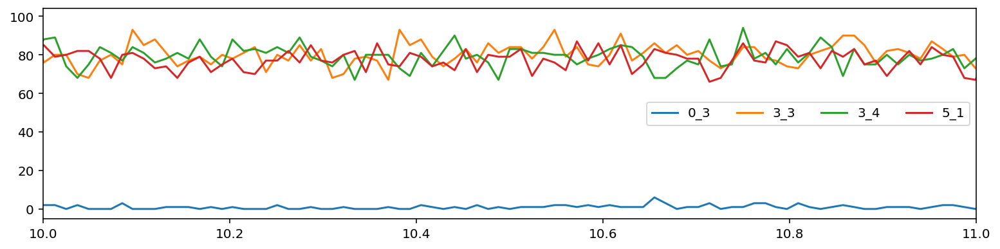

In [70]:
plt.figure(figsize=(13,3))
for i in np.unique(sum(interesting,tuple())):
    name = roiNames[i]
    plt.plot(time,roiTraces[name],label=name)
plt.legend(ncol=4)
# plt.xlim(100,102)
plt.xlim(10,11)

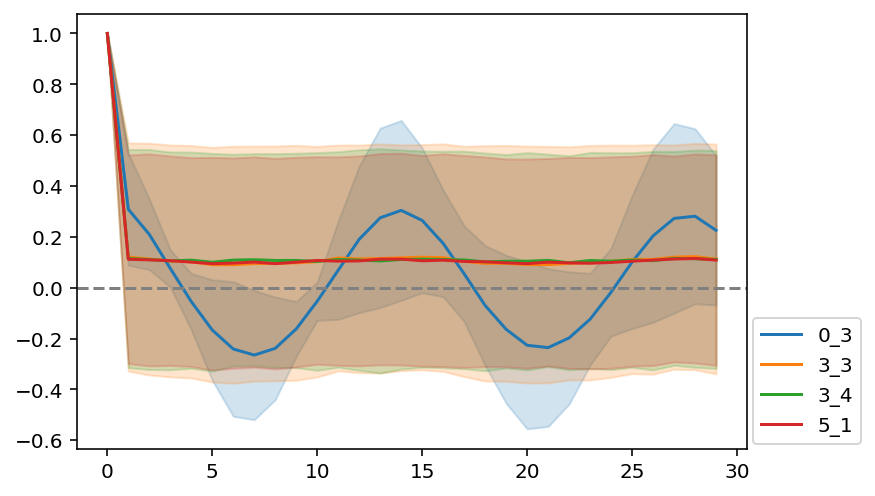

In [79]:
tr = np.arange(30)
scale = 1#metadata.freq
for i in np.unique(sum(interesting,tuple()))[:]:
    name = roiNames[i]
    y, ye = autocorr(roiTraces[name][:],tr,20)
    c = plt.plot(tr/scale, y,label=name)[0].get_color()
    plt.fill_between(tr/scale, y-2*ye, y+2*ye,color=c,alpha = .2)
plt.legend(loc=(1.01,.01))
plt.axhline(0,color="grey",ls="--")

In [74]:
def runningAverage(x_,filterSize):
    if filterSize%2==0:
        raise ValueError("filter size needs to be odd number")
    delta = filterSize//2
    out = np.zeros_like(x_)
    x_ = np.hstack([[x_[0]]*delta,x_,[x_[-1]]*delta])
#     print (x_.shape, out.shape)
    for i in range(len(out)):
        out[i] = np.nanmean(x_[i:i+filterSize])
    return out

In [91]:
scale = metadata.freq

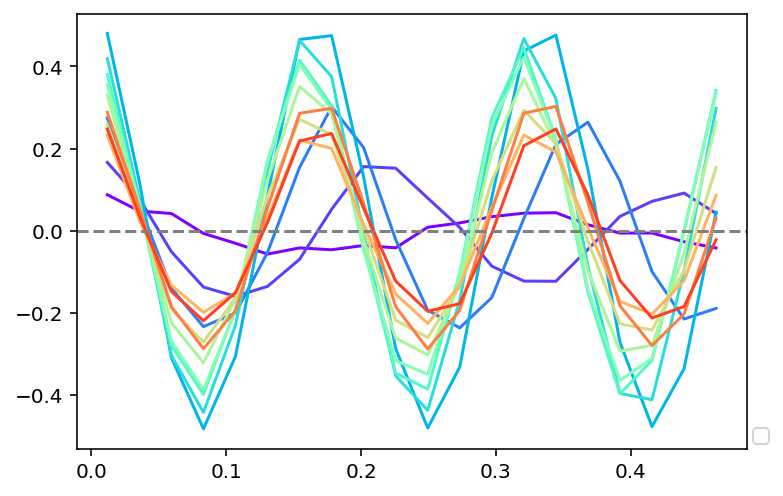

In [93]:
tr = np.arange(1,40,2)
name = "0_3"
nsplit = 12
x = roiTraces[name]
x = np.split(x[:len(x)//nsplit*nsplit],nsplit)
i = 0
for i,tmp in enumerate(x):
    y, ye = autocorr(tmp,tr,10)
    c = plt.plot(tr/scale, y, c=plt.cm.rainbow(i/nsplit))[0].get_color()
#     plt.fill_between(tr/scale, y-2*ye, y+2*ye,color=c,alpha = .2)
    i += 1
plt.legend(loc=(1.01,.01))
plt.axhline(0,color="grey",ls="--")

In [94]:
1/.18

5.555555555555555

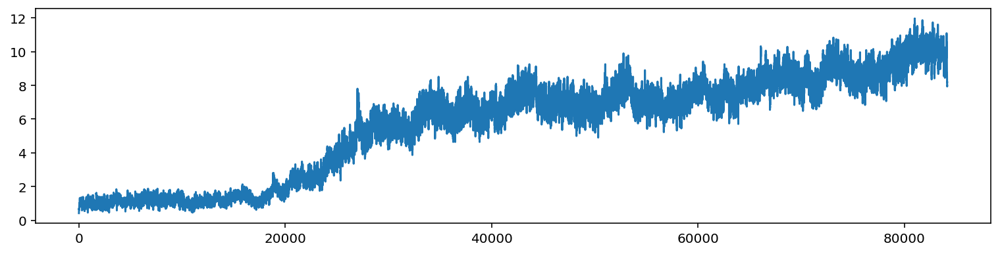

In [78]:
plt.figure(figsize=(13,3))
plt.plot(runningAverage(roiTraces["0_3"],31))

In [72]:
1./.75

1.3333333333333333

In [104]:
metadata.freq

84.28209973765061

In [103]:
1./50

0.02

In [107]:
npzFile

'/Volumes/physio/team/slakrupnik/project/experiments/Sandra/2019_10_14/Experiment37/Experiment37_2_Series006.npz'

# CNMF-E

In [7]:
fnames0 = 'Experiment39e_2_Series012_f=84.2Hz_d1_128_d2_128_d3_1_order_C_frames_84156_.mmap'
# fnames = "/Users/srdjan/Documents/Physio_Ca/data/Slice2_Glu8_007_f=45.8Hz_d1_64_d2_256_d3_1_order_C_frames_15789_.mmap"
# fnames = 'Nov 6 2019_16_Series106_6mM glucose_f=8.5Hz_d1_91_d2_128_d3_1_order_C_frames_8090_.mmap'
# fnames = 'ExperimentOGB_28_Series032_100-200_0-100_f=2.5Hz_d1_100_d2_100_d3_1_order_C_frames_5968_.mmap'

In [49]:
images0.shape

(84156, 128, 128)

In [1]:
# np.savez_compressed(,data=images0)

In [63]:
# load memory mappable file
Yr0, dims0, T0 = cm.load_memmap(fnames)
images0 = Yr0.T.reshape((T0,) + dims0, order='F')

In [10]:
frameRate = float(fnames0.split("f=")[1].split("Hz")[0])

In [11]:
images0.shape, frameRate

((84156, 128, 128), 84.2)

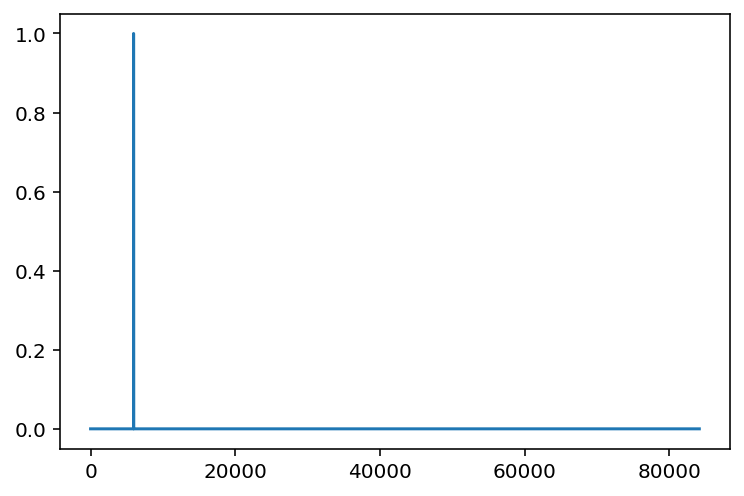

In [12]:
plt.plot(np.sum(images0>=images0.max(), (1,2)))

In [13]:
allTrace = images0.mean((1,2))

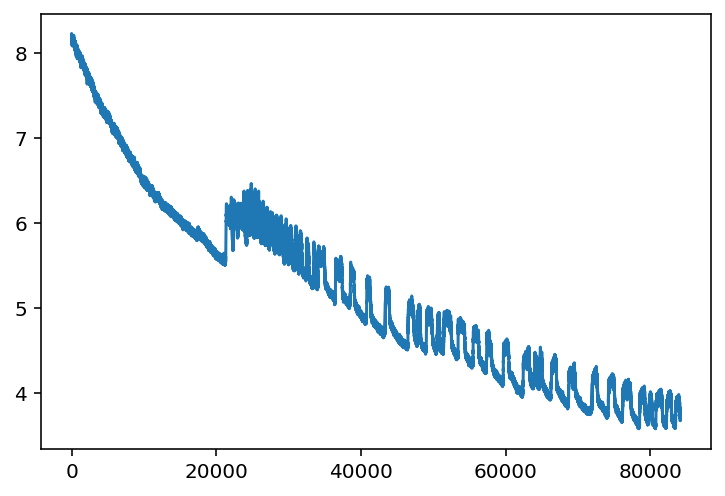

In [14]:
plt.plot(allTrace)

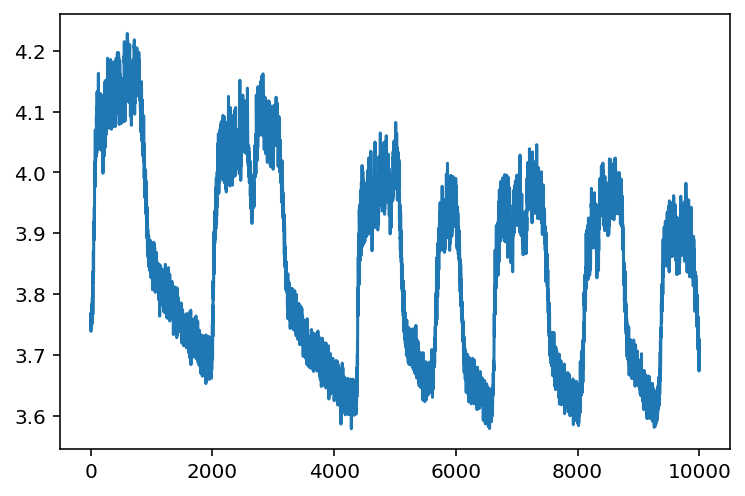

In [16]:
plt.plot(images0[-10000:].mean((1,2)))

In [17]:
partImages = images0[-10000:]

In [22]:
fname_part = cm.save_memmap([partImages], base_name=fnames0.split("Hz")[0]+"Hz", order='C',)

## Rest

In [23]:
time = np.arange(len(partImages))/frameRate

In [24]:
from matplotlib.colors import LogNorm

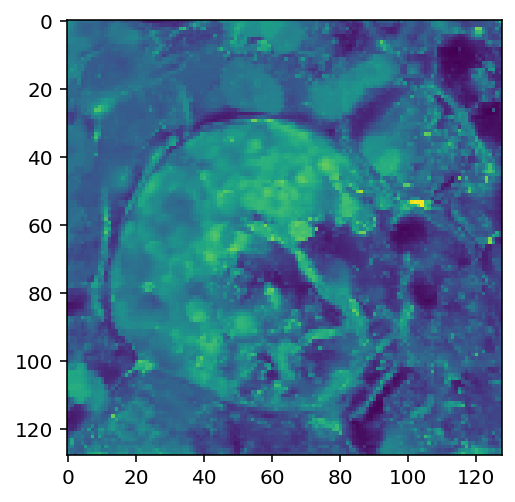

In [25]:
plt.imshow(partImages.std(0),norm=LogNorm())

In [26]:
# cm.movie(partImages).play(fr=1000, magnification=4)

In [64]:
#%% start a cluster for parallel processing (if a cluster already exists it will be closed and a new session will be opened)
if 'dview' in locals():
    cm.stop_server(dview=dview)
c, dview, n_processes = cm.cluster.setup_cluster(
    backend='local', n_processes=None, single_thread=False)

In [133]:
try:
    pxSize = metadata.pxSize
    neuronDiameter = 5
    neuronSizePx = int(neuronDiameter/pxSize)+1
    print ("got pixel size from metadata, all good")
except:
    neuronSizePx = int(input("please enter a reasonable size for neurons manually (in pixels)"))


please enter a reasonable size for neurons manually (in pixels)3


In [134]:
# gaussian width of a 2D gaussian kernel, which approximates a neuron
gSig = np.array([neuronSizePx]*2)
gSig

array([3, 3])

In [152]:
# dataset dependent parameters
frate = 1              # movie frame rate
decay_time = 10        # length of a typical transient in seconds

# motion correction parameters
motion_correct = False               # flag for performing motion correction
# pw_rigid = True                     # flag for performing piecewise-rigid motion correction (otherwise just rigid)
# gSig_filt = gSig                    # size of high pass spatial filtering, used in 1p data
# max_shifts = (3, 3)                 # maximum allowed rigid shift
# strides = np.array([10,20])         # start a new patch for pw-rigid motion correction every x pixels
# overlaps = (strides*.4).astype(int) # overlap between pathes (size of patch strides+overlaps)
# max_deviation_rigid = 3             # maximum deviation allowed for patch with respect to rigid shifts
# border_nan = 'copy'                 # replicate values along the boundaries

mc_dict = {
    'fnames': [fnames],
    'fr': frate,
    'decay_time': decay_time,
#     'pw_rigid': pw_rigid,
#     'max_shifts': max_shifts,
#     'gSig_filt': gSig_filt,
#     'strides': strides,
#     'overlaps': overlaps,
#     'max_deviation_rigid': max_deviation_rigid,
#     'border_nan': border_nan
}

opts = params.CNMFParams(params_dict=mc_dict)

In [153]:
# if motion_correct:
#     # do motion correction rigid
#     mc = MotionCorrect(fnames, dview=dview, **opts.get_group('motion'))
#     mc.motion_correct(save_movie=True)
#     fname_mc = mc.fname_tot_els if pw_rigid else mc.fname_tot_rig
#     if pw_rigid:
#         bord_px = np.ceil(np.maximum(np.max(np.abs(mc.x_shifts_els)),
#                                      np.max(np.abs(mc.y_shifts_els)))).astype(np.int)
#     else:
#         bord_px = np.ceil(np.max(np.abs(mc.shifts_rig))).astype(np.int)
#         plt.subplot(1, 2, 1); plt.imshow(mc.total_template_rig)  # % plot template
#         plt.subplot(1, 2, 2); plt.plot(mc.shifts_rig)  # % plot rigid shifts
#         plt.legend(['x shifts', 'y shifts'])
#         plt.xlabel('frames')
#         plt.ylabel('pixels')

#     bord_px = 0 if border_nan is 'copy' else bord_px
#     fname_new = cm.save_memmap(fname_mc, base_name='memmap_', order='C',
#                                border_to_0=bord_px)
# else:  # if no motion correction just memory map the file
#     fname_new = cm.save_memmap(mc_dict["fnames"], base_name='memmap_',
#                                order='C', border_to_0=0, dview=dview)

In [154]:
from collections import OrderedDict

In [155]:
# cn_filter0, pnr0 = cm.summary_images.correlation_pnr(images[:],
#                                                    gSig=3,
#                                                    swap_dim=False)

# fig, axs = plt.subplots(2,2,figsize=(10,9))
# for ax,t in zip(axs[0],["cn_filter0", "pnr0"]):
#     ax.set_title(t)
#     m = eval(t)
#     im = ax.imshow(m)
#     plt.colorbar(im, ax=ax, shrink = .6)

# # fig, axs = plt.subplots(1,2,figsize=(13,3))

# for ax,t in zip(axs[1],["cn_filter0", "pnr0"]):
#     ax.set_title(t)
#     m = eval(t)
#     ax.hist(m.flatten(),100)
#     ax.set_yscale("log")

In [156]:
images0.shape

(500, 40, 50)

In [157]:
gSig[0]

3

In [158]:
# cm.movie(images0).play(fr=100,magnification=4,do_loop=True,plot_text=True)

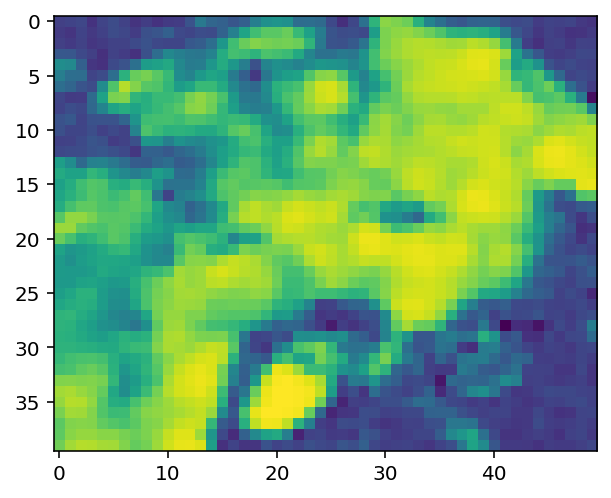

In [171]:
plt.imshow(cm.movie(images0).local_correlations(eight_neighbours=True, swap_dim=False))

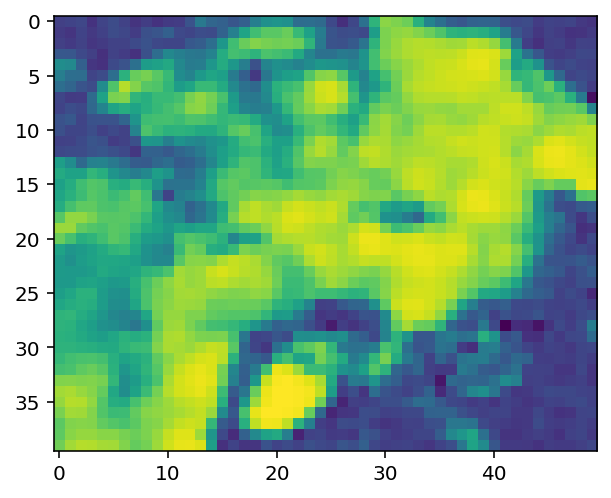

In [172]:
plt.imshow(cm.movie(images0).local_correlations(eight_neighbours=False, swap_dim=False))

In [159]:
cn_filter, pnr = cm.summary_images.correlation_pnr(images0,
                                                   gSig=gSig[0],
                                                   swap_dim=False)

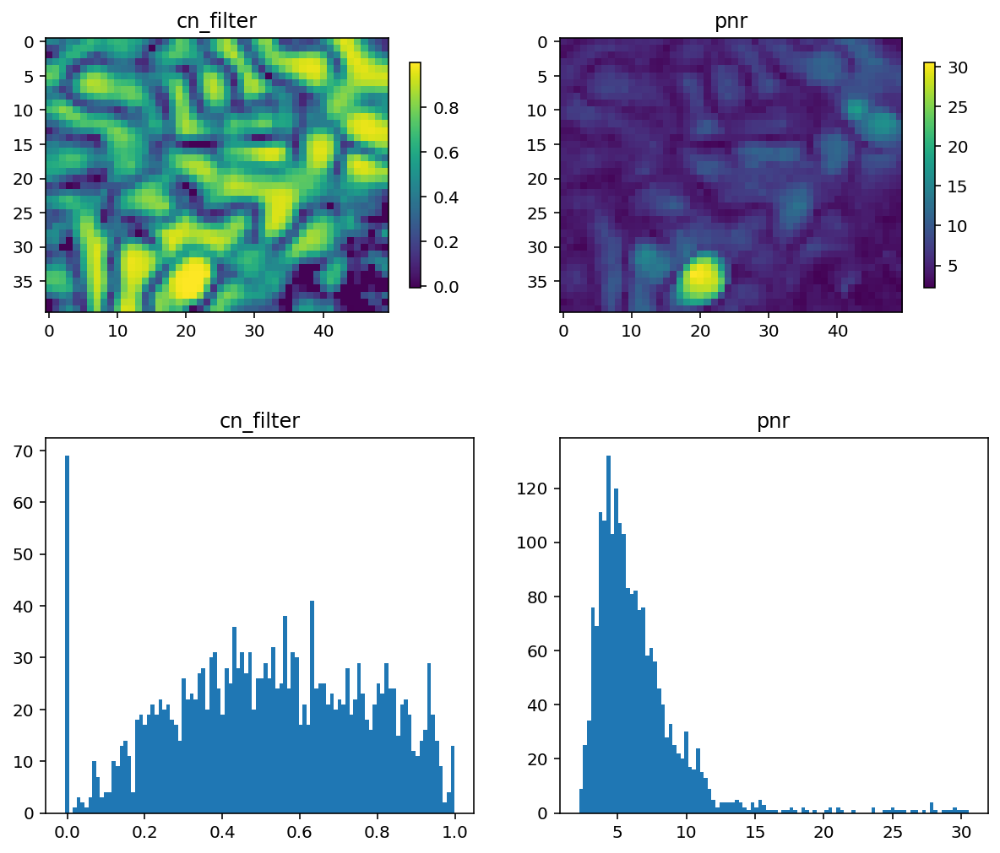

In [160]:

fig, axs = plt.subplots(2,2,figsize=(10,9))
for ax,t in zip(axs[0],["cn_filter", "pnr"]):
    ax.set_title(t)
    m = eval(t)
    im = ax.imshow(m)
    plt.colorbar(im, ax=ax, shrink = .6)

# fig, axs = plt.subplots(1,2,figsize=(13,3))

for ax,t in zip(axs[1],["cn_filter", "pnr"]):
    ax.set_title(t)
    m = eval(t)
    ax.hist(m.flatten(),100)
#     ax.set_yscale("log")

In [161]:
# fig = plt.figure()
# ax = plt.subplot(111)
# ax.imshow(cn_filter)

# pxWin = 12
# pxShows = {"my":(73,38)}

# addRoisToImage(pxShows,pxWin,ax=ax)

# trace = partImages[:,
#                pxShows["my"][0]:pxShows["my"][0]+pxWin,
#                pxShows["my"][1]:pxShows["my"][1]+pxWin,
#               ].mean((1,2))
# # plt.plot(trace)

In [162]:
# traceF = percFilter(trace,3,1001)

In [163]:
# # plt.plot(time,trace)
# # plt.plot(time, traceF)
# plt.plot(time,trace-traceF)

In [164]:
%%capture
# dataset dependent parameters
# # motion correction parameters
# motion_correct = True    # flag for performing motion correction
# pw_rigid = False         # flag for performing piecewise-rigid motion correction (otherwise just rigid)
# gSig_filt = (3, 3)       # size of high pass spatial filtering, used in 1p data
# max_shifts = (5, 5)      # maximum allowed rigid shift
# strides = (48, 48)       # start a new patch for pw-rigid motion correction every x pixels
# overlaps = (24, 24)      # overlap between pathes (size of patch strides+overlaps)
# max_deviation_rigid = 3  # maximum deviation allowed for patch with respect to rigid shifts
# border_nan = 'copy'      # replicate values along the boundaries

# mc_dict = {
#     'fnames': mc_dict["fna"],
#     'fr': frameRate,       # movie frame rate
#     'decay_time': .3,      # length of a typical transient in seconds
#     'pw_rigid': pw_rigid,
#     'max_shifts': max_shifts,
#     'gSig_filt': gSig_filt,
#     'strides': strides,
#     'overlaps': overlaps,
#     'max_deviation_rigid': max_deviation_rigid,
#     'border_nan': border_nan
# }

# opts = params.CNMFParams(params_dict=mc_dict)


# parameters for source extraction and deconvolution
gSiz = np.array(gSig)*4+1 # average diameter of a neuron, in general 4*gSig+1
merge_thr = .7            # merging threshold, max correlation allowed ########################################
rf = int(gSiz[0]*2.5)     # half-size of the patches in pixels. e.g., if rf=40, patches are 80x80
stride_cnmf = int(rf*.7)  # amount of overlap between the patches in pixels

p = 1                     # order of the autoregressive system
K = None                  # upper bound on number of components per patch, in general None
Ain = None                # possibility to seed with predetermined binary masks
                          # (keep it at least large as gSiz, i.e 4 times the neuron size gSig)
tsub = 1                  # downsampling factor in time for initialization,
                          # increase if you have memory problems
ssub = gSig[0]            # downsampling factor in space for initialization,
                          # increase if you have memory problems
                          # you can pass them here as boolean vectors
low_rank_background=None  # None leaves background of each patch intact,
                          # True performs global low-rank approximation if gnb>0
gnb = 0                   # number of background components (rank) if positive,
                          # else exact ring model with following settings
                          #     gnb= 0: Return background as b and W
                          #     gnb=-1: Return full rank background B
                          #     gnb<-1: Don't return background
nb_patch = 0              # number of background components (rank) per patch if gnb>0,
                          #     else it is set automatically
ssub_B = gSig[0]          # additional downsampling factor in space for background
ring_size_factor = 1.4    # radius of ring is gSiz*ring_size_factor

opts.change_params(params_dict={'method_init': 'corr_pnr',  # use this for 1 photon
                                'K': K,
                                'gSig': gSig,
                                'gSiz': gSiz,
                                'merge_thr': merge_thr,
                                'p': p,
                                'tsub': tsub,
                                'ssub': ssub,
                                'rf': rf,
                                'stride': stride_cnmf,
                                'only_init': True,    # set it to True to run CNMF-E
                                'nb': gnb,
                                'nb_patch': nb_patch,
                                'method_deconvolution': 'oasis',       # could use 'cvxpy' alternatively
                                'low_rank_background': low_rank_background,
                                'update_background_components': True,  # sometimes setting to False improve the results
#                                 'min_corr': min_corr,
#                                 'min_pnr': min_pnr,
                                'normalize_init': False,               # just leave as is
                                'center_psf': True,                    # leave as is for 1 photon
                                'ssub_B': ssub_B,
                                'ring_size_factor': ring_size_factor,
                                'del_duplicates': True,                # whether to remove duplicates from initialization
#                                 'border_pix': bord_px
                               })                # number of pixels to not consider in the borders)

In [165]:
%%capture
opts.change_params(params_dict={'min_corr': .7,'min_pnr': 8})

In [166]:
cnm = cnmf.CNMF(n_processes=n_processes,
                dview=dview,
                Ain=None,
                params=opts)

In [167]:
cnm.fit(images0)

In [168]:
cnm.estimates.A.shape

(2000, 0)

In [132]:
#%% COMPONENT EVALUATION
# the components are evaluated in three ways:
#   a) the shape of each component must be correlated with the data
#   b) a minimum peak SNR is required over the length of a transient
#   c) each shape passes a CNN based classifier

min_SNR = 10            # adaptive way to set threshold on the transient size
r_values_min = 0.85    # threshold on space consistency (if you lower more components
#                        will be accepted, potentially with worst quality)
cnm.params.set('quality', {'min_SNR': min_SNR,
                           'rval_thr': r_values_min,
                           'use_cnn': False})
cnm.estimates.evaluate_components(images0, cnm.params, dview=dview)

print(' ***** ')
print('Number of total components: ', len(cnm.estimates.C))
print('Number of accepted components: ', len(cnm.estimates.idx_components))

 ***** 
Number of total components:  0
Number of accepted components:  0


/Users/srdjan/anaconda2/envs/caiman/lib/python3.7/site-packages/caiman/components_evaluation.py:716: UserWarning: There were no components to evaluate. Check your parameter settings.
  warnings.warn("There were no components to evaluate. Check your parameter settings.")


In [39]:
#%% plot contour plots of accepted and rejected components
cnm.estimates.plot_contours_nb(img=cn_filter, idx=cnm.estimates.idx_components)

In [40]:
# accepted components
cnm.estimates.hv_view_components(img=cn_filter, idx=cnm.estimates.idx_components,
                                denoised_color='red', cmap='gray')

:DynamicMap   [unit_id,scale]
   :Layout
      .HSV.I     :HSV   [height,width]   (H,S,V)
      .Overlay.I :Overlay
         .Curve.I  :Curve   [frame #]   (y)
         .Curve.II :Curve   [frame #]   (y)

In [41]:
# rejected components
cnm.estimates.hv_view_components(img=cn_filter, idx=cnm.estimates.idx_components_bad,
                                denoised_color='red', cmap='gray')

:DynamicMap   [unit_id,scale]
   :Layout
      .HSV.I     :HSV   [height,width]   (H,S,V)
      .Overlay.I :Overlay
         .Curve.I  :Curve   [frame #]   (y)
         .Curve.II :Curve   [frame #]   (y)

(18, 15789)

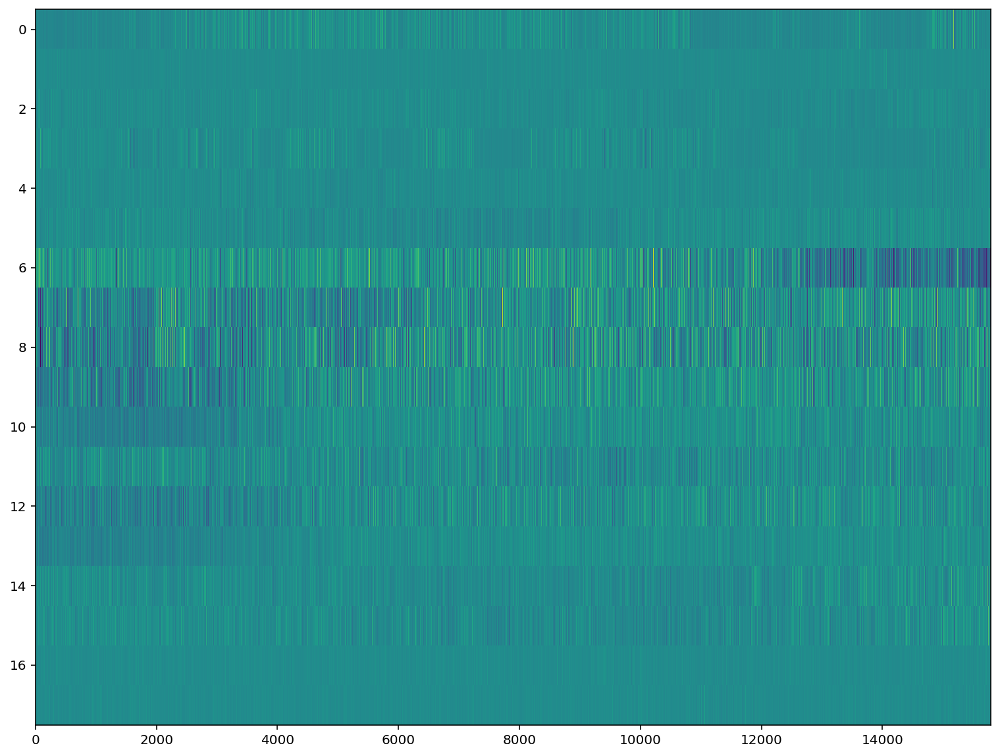

In [45]:
fig, ax = plt.subplots(1,1,figsize=(13,10))
ax.imshow(cnm.estimates.YrA)
ax.set_aspect("auto")

In [162]:
cnm.estimates.A

<16384x17 sparse matrix of type '<class 'numpy.float32'>'
	with 744 stored elements in Compressed Sparse Column format>

In [163]:
maxDims = []
for coords in cnm.estimates.coordinates:
    maxDims += [np.max(np.nanmax(coords["coordinates"][1:-1],axis=0)-
                       np.nanmin(coords["coordinates"][1:-1],axis=0))]

maxDims = np.array(maxDims)

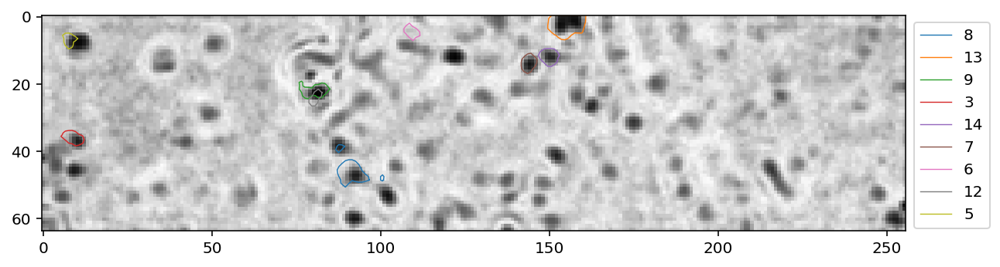

In [165]:
plt.figure(figsize=(10,10))
ax = plt.subplot(111)
ax.imshow(cn_filter, cmap='Greys')


for i in np.argsort(-maxDims)[:9]:
    x,y = cnm.estimates.coordinates[i]["coordinates"].T
    ax.plot(x-.5,y-.5,lw=.7,label=i)
ax.set_aspect("equal")
ax.legend(loc=(1.01,.01))

In [141]:
maxDims = []
for coords in cnm.estimates.coordinates:
    maxDims += [np.max(np.nanmax(coords["coordinates"][1:-1],axis=0)-
                       np.nanmin(coords["coordinates"][1:-1],axis=0))]

maxDims = np.array(maxDims)

In [148]:
from matplotlib.colors import LogNorm

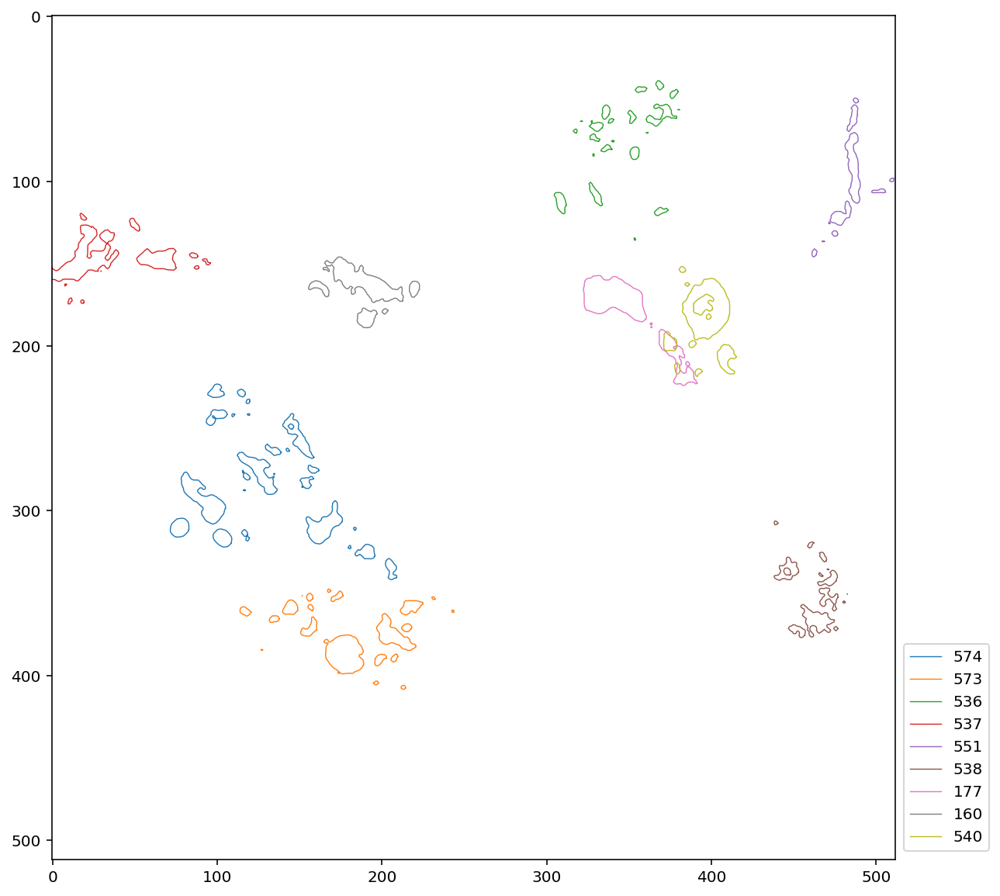

In [158]:
plt.figure(figsize=(10,10))
ax = plt.subplot(111)
ax.imshow(cn_filter, cmap='Greys',vmax=1000)


for i in np.argsort(-maxDims)[:9]:
    x,y = cnm.estimates.coordinates[i]["coordinates"].T
    ax.plot(x-.5,y-.5,lw=.7,label=i)
ax.set_aspect("equal")
ax.legend(loc=(1.01,.01))

# Understanding elements of the estimates

In [179]:
Ncomps = len(cnm.estimates.coordinates)

## A: set of spatial footprints

In [178]:
A = cnm.estimates.A

(262144, 580)

In [192]:
A.dtype, A.shape == (np.prod(images.shape[1:]), Ncomps)

(dtype('float64'), True)

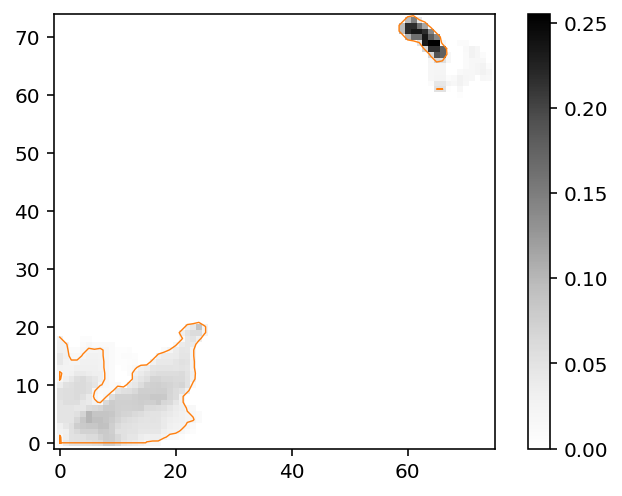

In [248]:
iComps = np.array([2,3])
a = np.asarray(A[:,iComps].todense()).sum(-1).reshape(dims)
ax = plt.subplot(111)
i,j = np.where(a>0)
im = ax.imshow(a.T,cmap="Greys")
plt.xlim(i.min()-1, i.max()+1)
plt.ylim(j.min()-1, j.max()+1)
plt.colorbar(im)
for iComp in iComps:
    x,y = cnm.estimates.coordinates[iComp]["coordinates"].T
    plt.plot(x,y,"C1",lw=.7)
ax.set_aspect("equal")

### Are any footprints overlapping?

In [255]:
from scipy.sparse import find as smfind

In [319]:
A>.1

<262144x580 sparse matrix of type '<class 'numpy.bool_'>'
	with 12467 stored elements in Compressed Sparse Column format>

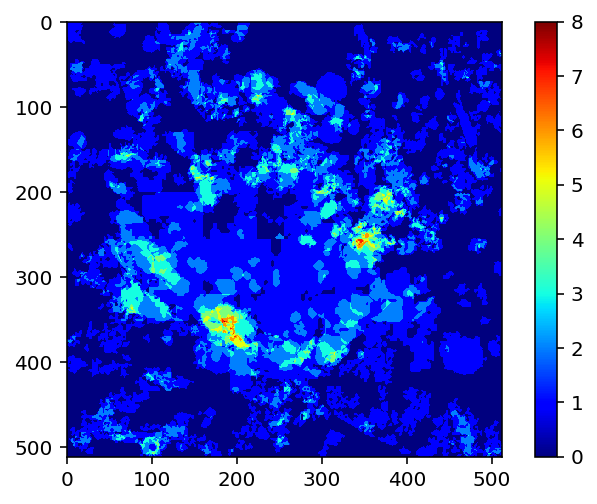

In [291]:
npxId = np.zeros(dims,dtype=np.int8)

Ab = A.astype(bool)

npxId.flat[:] = np.asarray(Ab.sum(axis=1)).flatten()

plt.imshow(npxId,cmap="jet")
plt.colorbar()

In [292]:
from collections import Counter

In [294]:
Counter(npxId.flatten()).most_common()

[(0, 123190),
 (1, 93878),
 (2, 32873),
 (3, 9147),
 (4, 2086),
 (5, 677),
 (6, 256),
 (7, 36),
 (8, 1)]

In [316]:
#a pixel with more Rois 
whichPxs = np.array(np.where(npxId==3)).T
ipx = whichPxs[np.random.choice(range(len(whichPxs)))]

In [317]:
iComps = smfind(Ab[ipx[0]*dims[0]+ipx[1]])[1]

(464, 479)

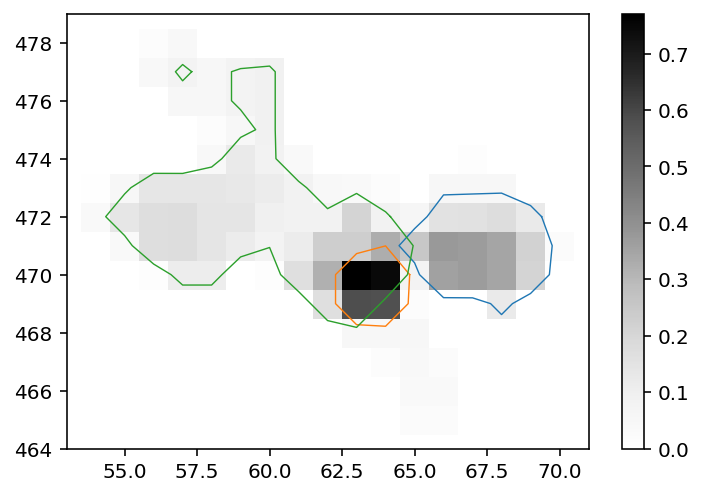

In [318]:
a = np.asarray(A[:,iComps].todense()).sum(-1).reshape(dims)
ax = plt.subplot(111)
i,j = np.where(a>0.001)
im = ax.imshow(a.T,cmap="Greys")
plt.colorbar(im)
for iComp in iComps:
    x,y = cnm.estimates.coordinates[iComp]["coordinates"].T
    plt.plot(x,y,lw=.7)
ax.set_aspect("equal")
plt.xlim(i.min()-1, i.max()+1)
plt.ylim(j.min()-1, j.max()+1)

In [309]:
a

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
def hv_view_patches(Yr, A, C, b, f, d1, d2, YrA=None, image_neurons=None, denoised_color=None, cmap='viridis'):
    """
    Interactive plotting utility for ipython notebook

    Args:
        Yr: np.ndarray
            movie

        A,C,b,f: np.ndarrays
            outputs of matrix factorization algorithm

        d1,d2: floats
            dimensions of movie (x and y)

        YrA:   np.ndarray
            ROI filtered residual as it is given from update_temporal_components
            If not given, then it is computed (K x T)

        image_neurons: np.ndarray
            image to be overlaid to neurons (for instance the average)

        denoised_color: string or None
            color name (e.g. 'red') or hex color code (e.g. '#F0027F')

        cmap: string
            name of colormap (e.g. 'viridis') used to plot image_neurons
    """

    nr, T = C.shape
    nA2 = np.ravel(np.power(A, 2).sum(0)) if type(
        A) == np.ndarray else np.ravel(A.power(2).sum(0))
    b = np.squeeze(b)
    f = np.squeeze(f)
    if YrA is None:
        Y_r = np.array(
            spdiags(old_div(1, nA2), 0, nr, nr) *
            (A.T * np.matrix(Yr) -
             (A.T * np.matrix(b[:, np.newaxis])) * np.matrix(f[np.newaxis]) -
             A.T.dot(A) * np.matrix(C)) + C)
    else:
        Y_r = C + YrA
    if image_neurons is None:
        image_neurons = A.mean(1).reshape((d1, d2), order='F')
    smp = cm.ScalarMappable(cmap=cmap)
    im_rgb = smp.to_rgba(image_neurons)[:, :, :3]
    im_hsv = mpl.colors.rgb_to_hsv(im_rgb)

    def norm(a, rg=(0, 1)):
        a_norm = (a - a.min()) / (a.max() - a.min())
        return a_norm * (rg[1] - rg[0]) + rg[0]

    Ad = np.asarray(A.todense()).reshape((d1, d2, -1), order='F')

    def plot_unit(uid, scl):
        trace = (
            hv.Curve(Y_r[uid, :], kdims='frame #').opts(framewise=True)
            * (hv.Curve(C[uid, :], kdims='frame #')
               .opts(color=denoised_color, framewise=True))
        ).opts(aspect=3, frame_height=200)
        A_scl = norm(Ad[:, :, uid], (scl, 1))
        im_hsv_scl = im_hsv.copy()
        im_hsv_scl[:, :, 2] = im_hsv[:, :, 2] * A_scl
        im_u = (hv.HSV(im_hsv_scl, kdims=['height', 'width'])
                .opts(aspect='equal', frame_height=200))
        return hv.Layout([im_u] + [trace]).cols(1) #im_u + trace

    return (hv.DynamicMap(plot_unit, kdims=['unit_id', 'scale'])
            .redim.range(unit_id=(0, nr-1), scale=(0.0, 1.0)))

In [167]:
old_div?

In [159]:
x#,y

array([         nan, 379.02823858, 379.03243861, 379.27268942,
       379.40911708, 379.45994542, 379.45994542, 379.        ,
       378.44044707, 378.        , 377.        , 376.39622422,
       376.        , 375.32717131, 375.36477213, 375.        ,
       374.36796443, 374.        , 373.        , 372.75366415,
       372.        , 371.78699537, 371.80082999, 371.78510345,
       371.68014241, 371.52257967, 371.47483091, 371.49269164,
       371.60835797, 371.61355478, 371.57723591, 372.        ,
       372.66221149, 373.        , 374.        , 375.        ,
       376.        , 377.        , 378.        , 378.39032955,
       379.        , 379.02823858,          nan, 381.29715458,
       381.40587314, 381.40587314, 381.10419483, 381.04534935,
       381.        , 380.12953496, 380.        , 379.        ,
       378.84483381, 378.19838753, 378.17141282, 378.34813617,
       378.53785311, 378.65001226, 379.        , 379.51505709,
       380.        , 380.76915131, 381.        , 381.29

In [66]:
ix = (slice(None), slice(50,150), slice(50,150))
cm.concatenate([
    m_orig[ix],
    np.ones_like(m_orig)[ix][:,:,:10]*np.nan,
    m_after_rigidmc[ix],
    np.ones_like(m_orig)[ix][:,:,:10]*np.nan,
    m_after_pwmc[ix],
],axis=2).play(fr=30,do_loop=True)

In [69]:
np.array(mc.x_shifts_els).shape

(80, 9)

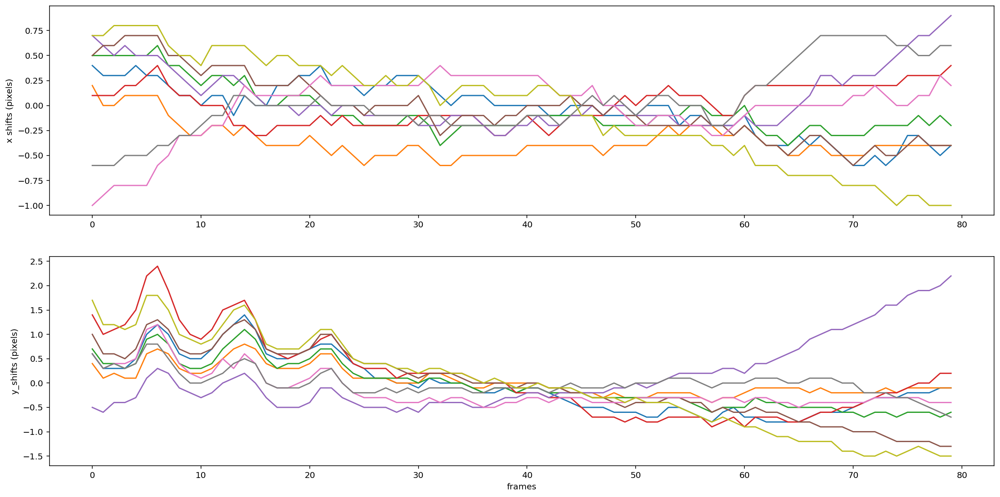

In [67]:
#%% visualize elastic shifts
plt.close()
plt.figure(figsize = (20,10))
plt.subplot(2, 1, 1)
plt.plot(mc.x_shifts_els)
plt.ylabel('x shifts (pixels)')
plt.subplot(2, 1, 2)
plt.plot(mc.y_shifts_els)
plt.ylabel('y_shifts (pixels)')
plt.xlabel('frames')
#%% compute borders to exclude
bord_px_els = np.ceil(np.maximum(np.max(np.abs(mc.x_shifts_els)),
                                 np.max(np.abs(mc.y_shifts_els)))).astype(np.int)

### Setup some parameters
We first set some parameters related to the data and motion correction and create a `params` object. We'll modify this object with additional settings later on. You can also set all the parameters at once as demonstrated in the `demo_pipeline.ipynb` notebook.

In [10]:
# # dataset dependent parameters
# frate = 2                      # movie frame rate
# decay_time = 2                 # length of a typical transient in seconds

# # motion correction parameters
# motion_correct = True    # flag for performing motion correction
# pw_rigid = False         # flag for performing piecewise-rigid motion correction (otherwise just rigid)
# gSig_filt = (3, 3)       # size of high pass spatial filtering, used in 1p data
# max_shifts = (5, 5)      # maximum allowed rigid shift
# strides = (48, 48)       # start a new patch for pw-rigid motion correction every x pixels
# overlaps = (24, 24)      # overlap between pathes (size of patch strides+overlaps)
# max_deviation_rigid = 3  # maximum deviation allowed for patch with respect to rigid shifts
# border_nan = 'copy'      # replicate values along the boundaries

# mc_dict = {
#     'fnames': fnames,
#     'fr': frate,
#     'decay_time': decay_time,
#     'pw_rigid': pw_rigid,
#     'max_shifts': max_shifts,
#     'gSig_filt': gSig_filt,
#     'strides': strides,
#     'overlaps': overlaps,
#     'max_deviation_rigid': max_deviation_rigid,
#     'border_nan': border_nan
# }

# opts = params.CNMFParams(params_dict=mc_dict)

### Load memory mapped file

In [28]:
# load memory mappable file
Yr, dims, T = cm.load_memmap(fname_new)
images = Yr.T.reshape((T,) + dims, order='F')

In [29]:
images.shape

(800, 256, 256)

In [30]:
m_orig.shape

(800, 256, 256)

In [31]:
fnames

['/Users/srdjan/Documents/Physio_Ca/data/Experiment28_Series041.tif']

In [36]:
m_orig[:].play(fr=100, magnification = 2)

### Parameter setting for CNMF-E
We now define some parameters for the source extraction step using the CNMF-E algorithm. 
We construct a new dictionary and use this to modify the *existing* `params` object,

In [82]:
# parameters for source extraction and deconvolution
p = 1               # order of the autoregressive system
K = None            # upper bound on number of components per patch, in general None
gSig = (3, 3)       # gaussian width of a 2D gaussian kernel, which approximates a neuron
gSiz = (13, 13)     # average diameter of a neuron, in general 4*gSig+1
Ain = None          # possibility to seed with predetermined binary masks
merge_thr = .7      # merging threshold, max correlation allowed
rf = 10             # half-size of the patches in pixels. e.g., if rf=40, patches are 80x80
stride_cnmf = 20    # amount of overlap between the patches in pixels
#                     (keep it at least large as gSiz, i.e 4 times the neuron size gSig)
tsub = 2            # downsampling factor in time for initialization,
#                     increase if you have memory problems
ssub = 1            # downsampling factor in space for initialization,
#                     increase if you have memory problems
#                     you can pass them here as boolean vectors
low_rank_background = None  # None leaves background of each patch intact,
#                     True performs global low-rank approximation if gnb>0
gnb = 0             # number of background components (rank) if positive,
#                     else exact ring model with following settings
#                         gnb= 0: Return background as b and W
#                         gnb=-1: Return full rank background B
#                         gnb<-1: Don't return background
nb_patch = 0        # number of background components (rank) per patch if gnb>0,
#                     else it is set automatically
min_corr = .8       # min peak value from correlation image
min_pnr = 10        # min peak to noise ration from PNR image
ssub_B = 2          # additional downsampling factor in space for background
ring_size_factor = 1.4  # radius of ring is gSiz*ring_size_factor

opts.change_params(params_dict={'method_init': 'corr_pnr',  # use this for 1 photon
                                'K': K,
                                'gSig': gSig,
                                'gSiz': gSiz,
                                'merge_thr': merge_thr,
                                'p': p,
                                'tsub': tsub,
                                'ssub': ssub,
                                'rf': rf,
                                'stride': stride_cnmf,
                                'only_init': True,    # set it to True to run CNMF-E
                                'nb': gnb,
                                'nb_patch': nb_patch,
                                'method_deconvolution': 'oasis',       # could use 'cvxpy' alternatively
                                'low_rank_background': low_rank_background,
                                'update_background_components': True,  # sometimes setting to False improve the results
                                'min_corr': min_corr,
                                'min_pnr': min_pnr,
                                'normalize_init': False,               # just leave as is
                                'center_psf': True,                    # leave as is for 1 photon
                                'ssub_B': ssub_B,
                                'ring_size_factor': ring_size_factor,
                                'del_duplicates': True,                # whether to remove duplicates from initialization
                                'border_pix': bord_px})                # number of pixels to not consider in the borders)

    52362396 [params.py:                 set():858] [5284] Changing key rf in group patch from None to 40
    52362397 [params.py:                 set():858] [5284] Changing key stride in group patch from None to 20
    52362398 [params.py:                 set():858] [5284] Changing key nb_patch in group patch from 1 to 0
    52362399 [params.py:                 set():858] [5284] Changing key low_rank_background in group patch from True to None
    52362399 [params.py:                 set():858] [5284] Changing key del_duplicates in group patch from False to True
    52362400 [params.py:                 set():858] [5284] Changing key p in group preprocess from 2 to 1
    52362401 [params.py:                 set():858] [5284] Changing key method_init in group init from greedy_roi to corr_pnr
    52362401 [params.py:                 set():858] [5284] Changing key K in group init from 30 to None
    52362402 [params.py:                 set():858] [5284] Changing key gSig in group init fro

CNMFParams:

data:

{'caiman_version': '1.6.3',
 'decay_time': 2,
 'dims': (512, 512),
 'dxy': (1, 1),
 'fnames': ['/Users/srdjan/Documents/Physio_Ca/data/Experiment28_Series041.tif'],
 'fr': 2,
 'last_commit': 'FILE-1571404903',
 'mmap_C': None,
 'mmap_F': None,
 'var_name_hdf5': 'mov'}

spatial_params:

{'block_size_spat': 5000,
 'dist': 3,
 'expandCore': array([[0, 0, 1, 0, 0],
       [0, 1, 1, 1, 0],
       [1, 1, 1, 1, 1],
       [0, 1, 1, 1, 0],
       [0, 0, 1, 0, 0]]),
 'extract_cc': True,
 'maxthr': 0.1,
 'medw': None,
 'method_exp': 'dilate',
 'method_ls': 'lasso_lars',
 'n_pixels_per_process': None,
 'nb': 0,
 'normalize_yyt_one': True,
 'nrgthr': 0.9999,
 'num_blocks_per_run_spat': 20,
 'se': array([[1, 1, 1],
       [1, 1, 1],
       [1, 1, 1]], dtype=uint8),
 'ss': array([[1, 1, 1],
       [1, 1, 1],
       [1, 1, 1]], dtype=uint8),
 'thr_method': 'nrg',
 'update_background_components': True}

temporal_params:

{'ITER': 2,
 'bas_nonneg': False,
 'block_size_temp': 5000,
 

### Inspect summary images and set parameters
Check the optimal values of `min_corr` and `min_pnr` by moving slider in the figure that pops up. You can modify them in the `params` object. 
Note that computing the correlation pnr image can be computationally and memory demanding for large datasets. In this case you can compute
only on a subset of the data (the results will not change). You can do that by changing `images[::1]` to `images[::5]` or something similar.
This will compute the correlation pnr image

In [83]:
# compute some summary images (correlation and peak to noise)
cn_filter, pnr = cm.summary_images.correlation_pnr(images[::1], gSig=gSig[0], swap_dim=False) # change swap dim if output looks weird, it is a problem with tiffile
# inspect the summary images and set the parameters
nb_inspect_correlation_pnr(cn_filter, pnr)

:Layout
   .AdjointLayout.Correlation :AdjointLayout
      :Image   [x,y]   (corr)
      :DynamicMap   []
         :Histogram   [corr]   (corr_frequency)
   .AdjointLayout.Pnr         :AdjointLayout
      :Image   [x,y]   (pnr)
      :DynamicMap   []
         :Histogram   [pnr]   (pnr_frequency)

You can inspect the correlation and PNR images to select the threshold values for `min_corr` and `min_pnr`. The algorithm will look for components only in places where these value are above the specified thresholds. You can adjust the dynamic range in the plots shown above by choosing the selection tool (third button from the left) and selecting the desired region in the histogram plots on the right of each panel.

In [84]:
# print parameters set above, modify them if necessary based on summary images
print(min_corr) # min correlation of peak (from correlation image)
print(min_pnr)  # min peak to noise ratio

0.8
10


### Run the CNMF-E algorithm

In [85]:
cnm = cnmf.CNMF(n_processes=n_processes, dview=dview, Ain=Ain, params=opts)
cnm.fit(images)

    55195261 [params.py:                 set():858] [5284] Changing key n_processes in group patch from 1 to 8
    55195263 [params.py:                 set():858] [5284] Changing key init_batch in group online from 200 to 8000
    55195264 [cnmf.py:                 fit():468] [5284] (8000, 512, 512)
    55195264 [params.py:                 set():858] [5284] Changing key medw in group spatial from None to (3, 3)
    55195266 [cnmf.py:                 fit():485] [5284] Using 8 processes
    55195270 [params.py:                 set():858] [5284] Changing key n_pixels_per_process in group preprocess from None to 6510
    55195271 [params.py:                 set():858] [5284] Changing key n_pixels_per_process in group spatial from None to 6510
    55195271 [cnmf.py:                 fit():496] [5284] using 6510 pixels per process
    55195272 [cnmf.py:                 fit():497] [5284] using 5000 block_size_spat
    55195273 [cnmf.py:                 fit():498] [5284] using 5000 block_size_t

In [211]:
cnm.save(fname_mc[0].replace(".mmap",".hdf5"))
# ("")

/Users/srdjan/anaconda2/envs/caiman/lib/python3.7/site-packages/caiman/utils/utils.py:441: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  if not np.array_equal(h5file[path + key].value, item):
/Users/srdjan/anaconda2/envs/caiman/lib/python3.7/site-packages/caiman/utils/utils.py:432: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  if not h5file[path + key].value == item:
    63128179 [utils.py:recursively_save_dict_contents_to_group():447] [5284] A is sparse ****
    63130758 [utils.py:recursively_save_dict_contents_to_group():447] [5284] W is sparse ****
    63131493 [utils.py:recursively_save_dict_contents_to_group():414] [5284] g is an object type
    63131509 [utils.py:recursively_save_dict_contents_to_group():422] [5284] ['groups', 'idx_tot', 'ind_A', 'Ab_epoch', 'coordinates', 'loaded_model', 'optional_outputs', 'merged_ROIs', '** not saved']
    63131510 [utils.py:recursively_save_dict_contents_to_group(

### Alternate way to run the pipeline at once
It is possible to run the combined steps of motion correction, memory mapping, and cnmf fitting in one step as shown below. The command is commented out since the analysis has already been performed. It is recommended that you familiriaze yourself with the various steps and the results of the various steps before using it.

In [86]:
# cnm1 = cnmf.CNMF(n_processes, params=opts, dview=dview)
# cnm1.fit_file(motion_correct=motion_correct)

## Component Evaluation

The processing in patches creates several spurious components. These are filtered out by evaluating each component using three different criteria:

- the shape of each component must be correlated with the data at the corresponding location within the FOV
- a minimum peak SNR is required over the length of a transient
- each shape passes a CNN based classifier

<img src="../../docs/img/evaluationcomponent.png"/>
After setting some parameters we again modify the existing `params` object.

In [87]:
#%% COMPONENT EVALUATION
# the components are evaluated in three ways:
#   a) the shape of each component must be correlated with the data
#   b) a minimum peak SNR is required over the length of a transient
#   c) each shape passes a CNN based classifier

min_SNR = 3            # adaptive way to set threshold on the transient size
r_values_min = 0.85    # threshold on space consistency (if you lower more components
#                        will be accepted, potentially with worst quality)
cnm.params.set('quality', {'min_SNR': min_SNR,
                           'rval_thr': r_values_min,
                           'use_cnn': False})
cnm.estimates.evaluate_components(images, cnm.params, dview=dview)

print(' ***** ')
print('Number of total components: ', len(cnm.estimates.C))
print('Number of accepted components: ', len(cnm.estimates.idx_components))

    57175298 [params.py:                 set():858] [5284] Changing key min_SNR in group quality from 2.5 to 3
    57175300 [params.py:                 set():858] [5284] Changing key rval_thr in group quality from 0.8 to 0.85
    57175301 [params.py:                 set():858] [5284] Changing key use_cnn in group quality from True to False
    57175488 [components_evaluation.py:estimate_components_quality():696] [5284] Component evaluation in parallel


 ***** 
Number of total components:  1845
Number of accepted components:  1680


### Do some plotting

In [88]:
#%% plot contour plots of accepted and rejected components
cnm.estimates.plot_contours_nb(img=cn_filter, idx=cnm.estimates.idx_components)

View traces of accepted and rejected components. Note that if you get data rate error you can start Jupyter notebooks using:
'jupyter notebook --NotebookApp.iopub_data_rate_limit=1.0e10'

In [92]:
len(cnm.estimates.coordinates)

1845

In [97]:
plt.imshow(cn_filter)

In [122]:
cnm.estimates.SNR_comp.shape

(1845,)

In [144]:
maxDims = []
for coords in cnm.estimates.coordinates:
    maxDims += [np.max(np.nanmax(coords["coordinates"][1:-1],axis=0)-
                       np.nanmin(coords["coordinates"][1:-1],axis=0))]

In [147]:
maxDims = np.array(maxDims)

In [191]:
%matplotlib inline

    62156446 [pyplot.py:      switch_backend():225] [5284] Loaded backend module://ipykernel.pylab.backend_inline version unknown.


In [192]:
%config InlineBackend.figure_format = 'retina'

    62233425 [ticker.py:         tick_values():2300] [5284] vmin 0.6865942807383837 vmax 2687.176476354904
    62233426 [ticker.py:         tick_values():2351] [5284] ticklocs array([1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04, 1.e+05])
    62233436 [ticker.py:         tick_values():2300] [5284] vmin 0.6865942807383837 vmax 2687.176476354904
    62233437 [ticker.py:         tick_values():2351] [5284] ticklocs array([1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04, 1.e+05])
    62233440 [ticker.py:         tick_values():2300] [5284] vmin 0.6865942807383837 vmax 2687.176476354904
    62233441 [ticker.py:         tick_values():2351] [5284] ticklocs array([2.e-02, 3.e-02, 4.e-02, 5.e-02, 6.e-02, 7.e-02, 8.e-02, 9.e-02,
       2.e-01, 3.e-01, 4.e-01, 5.e-01, 6.e-01, 7.e-01, 8.e-01, 9.e-01,
       2.e+00, 3.e+00, 4.e+00, 5.e+00, 6.e+00, 7.e+00, 8.e+00, 9.e+00,
       2.e+01, 3.e+01, 4.e+01, 5.e+01, 6.e+01, 7.e+01, 8.e+01, 9.e+01,
       2.e+02, 3.e+02, 4.e+02, 5.e+02, 6.e+0

    62233898 [ticker.py:         tick_values():2351] [5284] ticklocs array([2.e-02, 3.e-02, 4.e-02, 5.e-02, 6.e-02, 7.e-02, 8.e-02, 9.e-02,
       2.e-01, 3.e-01, 4.e-01, 5.e-01, 6.e-01, 7.e-01, 8.e-01, 9.e-01,
       2.e+00, 3.e+00, 4.e+00, 5.e+00, 6.e+00, 7.e+00, 8.e+00, 9.e+00,
       2.e+01, 3.e+01, 4.e+01, 5.e+01, 6.e+01, 7.e+01, 8.e+01, 9.e+01,
       2.e+02, 3.e+02, 4.e+02, 5.e+02, 6.e+02, 7.e+02, 8.e+02, 9.e+02,
       2.e+03, 3.e+03, 4.e+03, 5.e+03, 6.e+03, 7.e+03, 8.e+03, 9.e+03,
       2.e+04, 3.e+04, 4.e+04, 5.e+04, 6.e+04, 7.e+04, 8.e+04, 9.e+04,
       2.e+05, 3.e+05, 4.e+05, 5.e+05, 6.e+05, 7.e+05, 8.e+05, 9.e+05])
    62233918 [ticker.py:         tick_values():2300] [5284] vmin 0.6865942807383837 vmax 2687.176476354904
    62233920 [ticker.py:         tick_values():2351] [5284] ticklocs array([1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04, 1.e+05])
    62233923 [ticker.py:         tick_values():2300] [5284] vmin 0.6865942807383837 vmax 2687.176476354904
    622

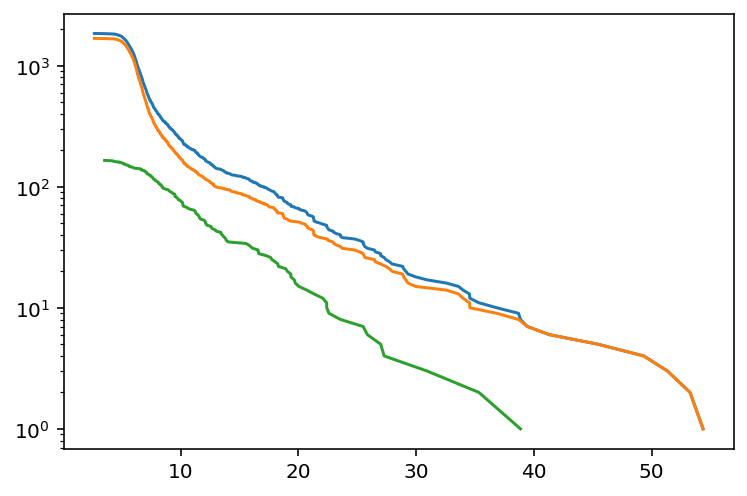

In [197]:
# %%capture
ax = plt.subplot(111)
for x in [maxDims,maxDims[cnm.estimates.idx_components],maxDims[cnm.estimates.idx_components_bad]]:
#     ax.plot(sorted(x),np.linspace(0,1,len(x)+1)[1:][::-1])
    ax.plot(sorted(x),np.arange(1,len(x)+1)[::-1])
ax.set_yscale("log")
#     ax.hist(x,np.linspace(0,50,101), histtype="step")

In [198]:
idInteresting = np.argsort(-maxDims)[0]

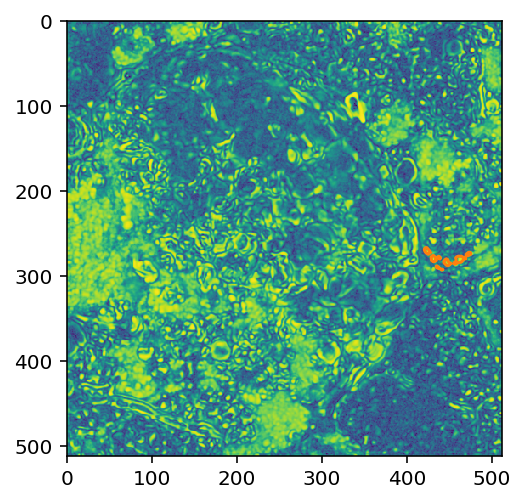

In [199]:
x,y = cnm.estimates.coordinates[idInteresting]["coordinates"].T

plt.imshow(cn_filter)
plt.plot([])
plt.plot(x-.5,y-.5)


In [159]:
# cnm.estimates.hv_view_components()

In [200]:
cnm.estimates.hv_view_components??

In [201]:
cm.utils.visualization.hv_view_patches??

In [172]:
# strange components
cnm.estimates.hv_view_components(
    img=cn_filter,
    idx=np.argsort(-maxDims)[:10],
    denoised_color='red', cmap='gray')

:DynamicMap   [unit_id,scale]
   :Layout
      .HSV.I     :HSV   [height,width]   (H,S,V)
      .Overlay.I :Overlay
         .Curve.I  :Curve   [frame #]   (y)
         .Curve.II :Curve   [frame #]   (y)

In [212]:
# accepted components
cnm.estimates.hv_view_components(img=cn_filter, idx=cnm.estimates.idx_components,
                                denoised_color='red', cmap='gray')

:DynamicMap   [unit_id,scale]
   :Layout
      .HSV.I     :HSV   [height,width]   (H,S,V)
      .Overlay.I :Overlay
         .Curve.I  :Curve   [frame #]   (y)
         .Curve.II :Curve   [frame #]   (y)

In [213]:
# rejected components
cnm.estimates.hv_view_components(img=cn_filter, idx=cnm.estimates.idx_components_bad,
                                denoised_color='red', cmap='gray')

:DynamicMap   [unit_id,scale]
   :Layout
      .HSV.I     :HSV   [height,width]   (H,S,V)
      .Overlay.I :Overlay
         .Curve.I  :Curve   [frame #]   (y)
         .Curve.II :Curve   [frame #]   (y)

### Stop cluster

In [ ]:
cm.stop_server(dview=dview)

### Some instructive movies
Play the reconstructed movie alongside the original movie and the (amplified) residual

In [ ]:
# with background 
cnm.estimates.play_movie(images, q_max=99.5, magnification=2,
                                 include_bck=True, gain_res=10, bpx=bord_px)

In [ ]:
# without background
cnm.estimates.play_movie(images, q_max=99.9, magnification=2,
                                 include_bck=False, gain_res=4, bpx=bord_px)